# Climate Vulnerability Analysis: NASA POWER Data Collection

## Project Overview
This project collects and analyzes climate data from NASA's POWER (Prediction Of Worldwide Energy Resources) API for regions particularly vulnerable to extreme temperatures and heat waves. The dataset includes key meteorological parameters that help us understand climate patterns and trends in these sensitive areas.

![Climate Change](https://climate.nasa.gov/internal_resources/2506)

## Data Sources
- **NASA POWER API**: Provides historical weather and solar data at hourly resolution
- **Target Regions**: Seven simulated locations representing real climate-vulnerable areas:
  - Extreme heat zones (Sunblaze Valley, Heatburg)
  - Arid regions (Droughtford, Flame Oasis)
  - High solar radiation areas (Ember Delta, Scorch Basin)

## Key Parameters Collected
| Parameter | Description | Units |
|-----------|-------------|-------|
| T2M | Air Temperature at 2m | °C |
| RH2M | Relative Humidity at 2m | % |
| ALLSKY_SFC_SW_DWN | Solar Radiation | W/m² |
| WS10M | Wind Speed at 10m | m/s |
| UV_INDEX | Ultraviolet Index | Unitless |

## Analysis Objectives
1. Identify temperature trends in vulnerable regions (2001-2024)
2. Analyze solar radiation’s impact on extreme heat.
3. Assess humidity patterns during heat waves.
4. Compare climate vulnerability across different geographies
5. Quantify key threats (heat, UV, drought, humidity).

## Notebook Structure
1. **Data Collection**: API requests and preprocessing
2. **Exploratory Analysis**: Statistical summaries and visualizations
3. **Trend Analysis**: Time-series examination of key parameters
4. **Comparative Analysis**: Region-to-region comparisons


# Climate Vulnerability Analysis
## NASA POWER Data for Extreme Climate Regions

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import os
from scipy.stats import linregress
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.patheffects as path_effects
from scipy import stats

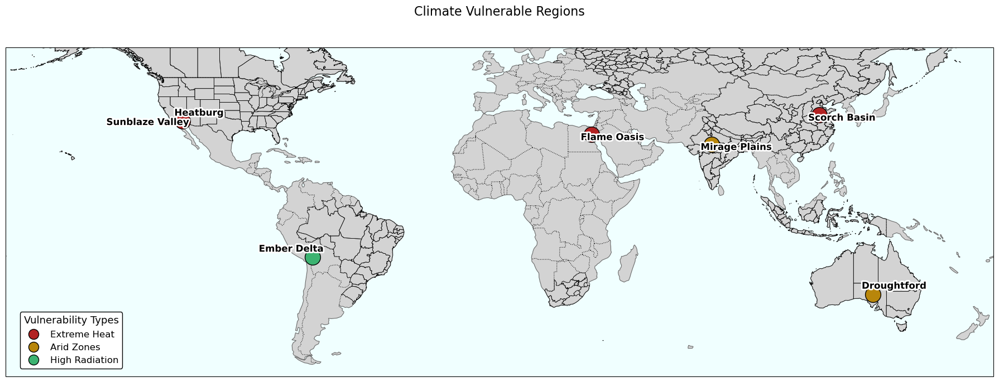

In [2]:
# Adjusted coordinates to move Heatburg closer to Sunblaze Valley
climate_vulnerable_regions = {
    "Sunblaze Valley": (33.7, -116.2),  # Original Coachella Valley location
    "Mirage Plains": (24.6, 77.3),      # Rajasthan, India
    "Ember Delta": (-16.5, -68.1),      # Bolivia Altiplano
    "Scorch Basin": (35.3, 116.5),      # Shandong, China (corrected)
    "Droughtford": (-30.0, 136.0),      # South Australia
    "Heatburg": (33.1, -115.5),         # Moved closer to Sunblaze Valley (originally 32.6, -114.6)
    "Flame Oasis": (28.2, 33.6)         # Egypt's Eastern Desert
}

# Categorization
extreme_heat_zones = {
    k: climate_vulnerable_regions[k] for k in ["Sunblaze Valley", "Heatburg", "Scorch Basin", "Flame Oasis"]
}
arid_zones = {
    k: climate_vulnerable_regions[k] for k in ["Droughtford", "Mirage Plains"]
}
radiation_zones = {
    "Ember Delta": climate_vulnerable_regions["Ember Delta"]
}

# Create figure
fig = plt.figure(figsize=(18, 10))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_global()

# Enhanced background
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='azure')
ax.add_feature(cfeature.COASTLINE, linewidth=0.8, edgecolor='dimgray')

# Plotting function with dynamic label placement
def plot_points(zone_dict, color, label, size=20):
    for name, (lat, lon) in zone_dict.items():
        ax.plot(lon, lat, 'o', color=color, markersize=size,
                markeredgecolor='black', markeredgewidth=1,
                transform=ccrs.PlateCarree())
        
        # Special label positioning for clustered points
        if name == "Sunblaze Valley":
            offset_lon, offset_lat = 3, -2  # Label to northeast
        elif name == "Heatburg":
            offset_lon, offset_lat = -3, 2  # Label to southwest
        else:
            offset_lon = 4 if lon < 0 else -4
            offset_lat = 2 if lat < 0 else -2
            
        text = ax.text(lon + offset_lon, lat + offset_lat, name,
                      fontsize=12, weight='bold', color='black',
                      transform=ccrs.PlateCarree(),
                      ha='right' if offset_lon > 0 else 'left')
        text.set_path_effects([
            path_effects.Stroke(linewidth=4, foreground='white'),
            path_effects.Normal()
        ])
    
    ax.plot([], [], 'o', color=color, markersize=size//1.5,
            label=label, markeredgecolor='black', markeredgewidth=1)

# Plot all zones
plot_points(extreme_heat_zones, 'firebrick', 'Extreme Heat')
plot_points(arid_zones, 'darkgoldenrod', 'Arid Zones')
plot_points(radiation_zones, 'mediumseagreen', 'High Radiation')

# Add reference features
ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.8)
ax.add_feature(cfeature.STATES.with_scale('50m'), linewidth=0.5)  # Show US states

# Enhanced legend
legend = ax.legend(loc='lower left', fontsize=12, framealpha=1,
                  title="Vulnerability Types", title_fontsize=13,
                  bbox_to_anchor=(0.01, 0.01))
legend.get_frame().set_edgecolor('black')

# Title with distance info
plt.title("Climate Vulnerable Regions", 
         fontsize=16, pad=20, y=1.05)

# Focus view on relevant areas
ax.set_extent([-180, 180, -60, 60])

plt.tight_layout()
plt.show()

In [3]:
df = pd.read_csv('climate_data_2001_2024.CSV')
#df.head()
df.info()
#print(f"Dataset contains {len(df):,} hourly records")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4418064 entries, 0 to 4418063
Data columns (total 18 columns):
 #   Column               Dtype  
---  ------               -----  
 0   YEAR                 int64  
 1   MONTH                int64  
 2   DAY                  int64  
 3   HOUR                 int64  
 4   LATITUDE             float64
 5   LONGITUDE            float64
 6   REGION               object 
 7   ALLSKY_SFC_UV_INDEX  float64
 8   CLRSKY_SFC_SW_DWN    float64
 9   ALLSKY_SFC_SW_DWN    float64
 10  ALLSKY_SFC_SW_DIFF   float64
 11  ALLSKY_SFC_SW_DNI    float64
 12  SZA                  float64
 13  T2M                  float64
 14  T2MDEW               float64
 15  RH2M                 float64
 16  WS10M                float64
 17  WD10M                float64
dtypes: float64(13), int64(4), object(1)
memory usage: 606.7+ MB


# 1. Temperature Analysis

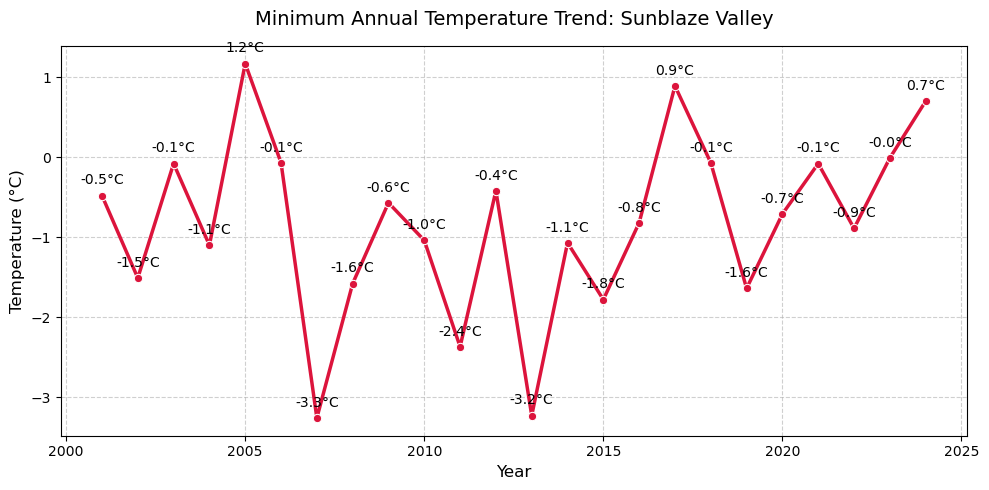

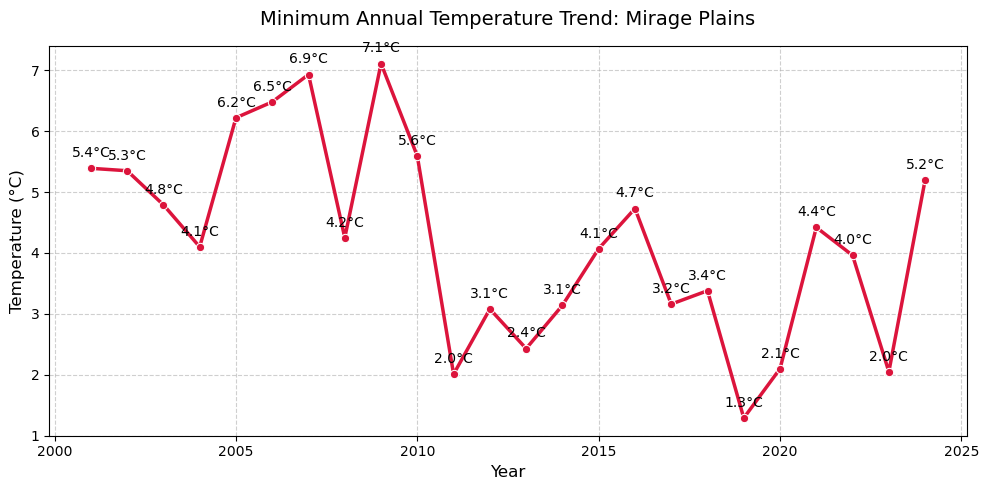

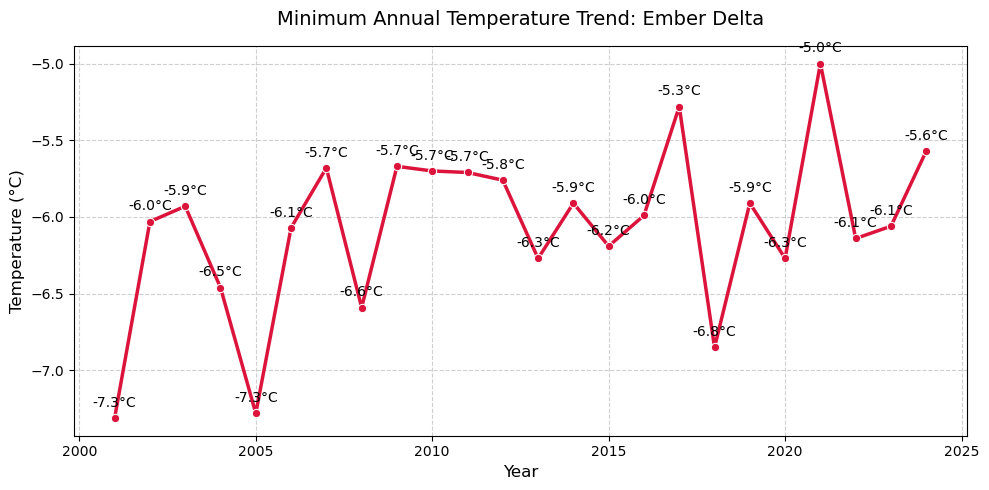

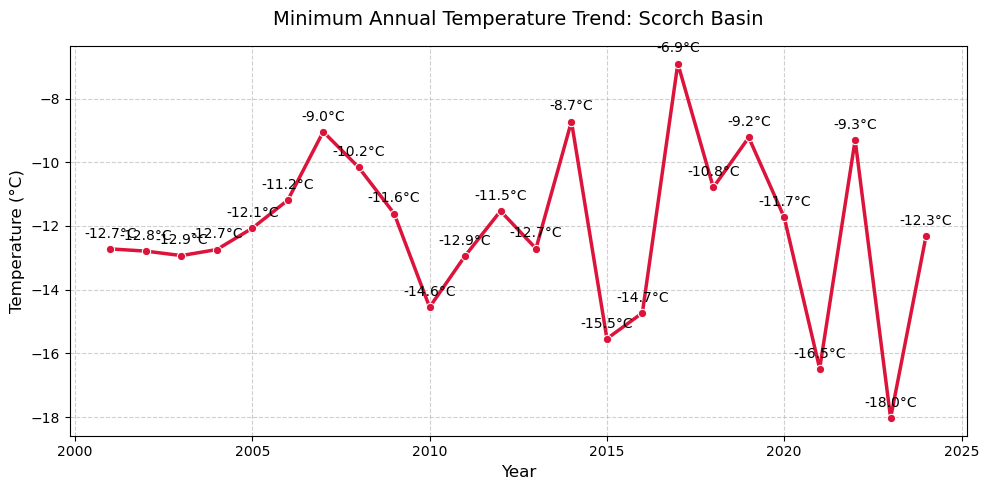

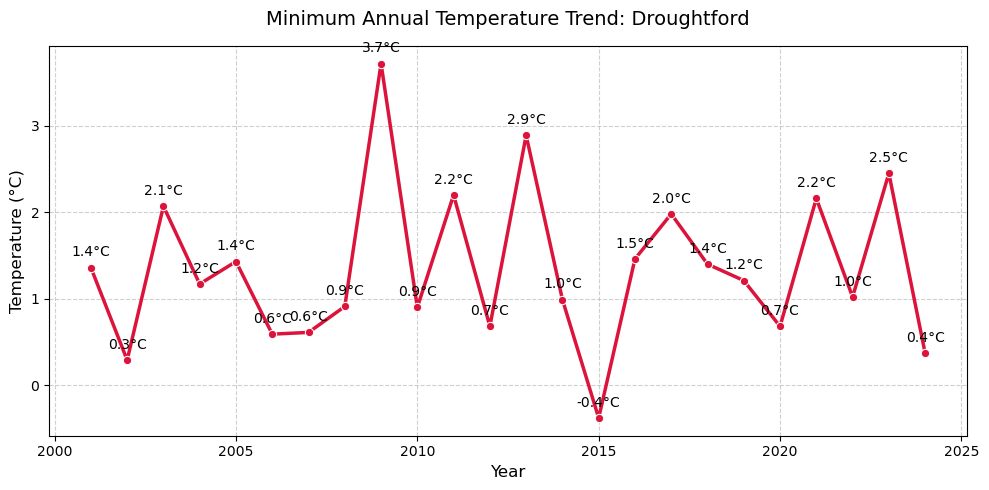

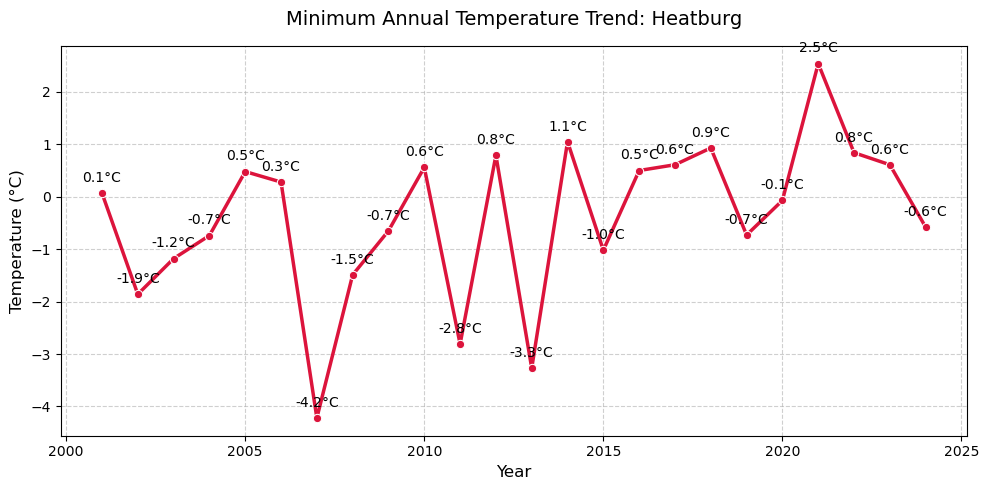

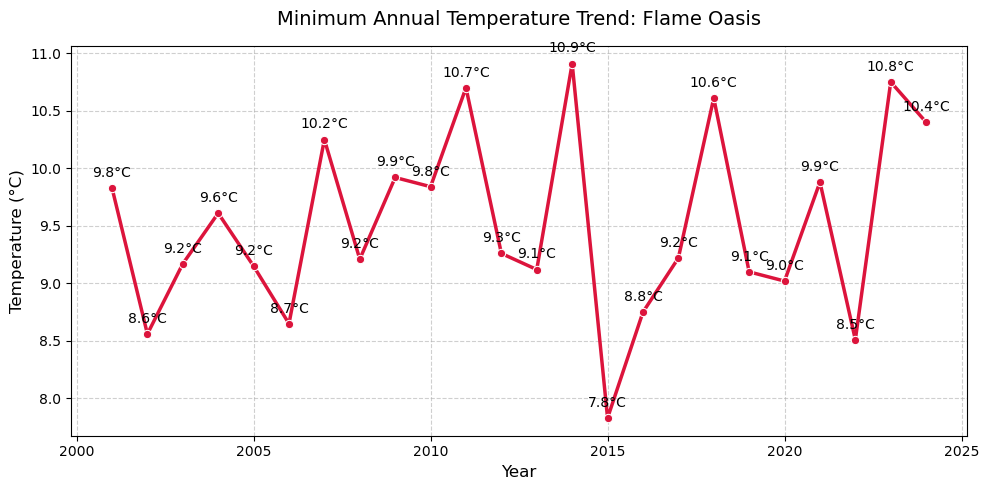

In [4]:
# Get unique region names from the dataset
regions_list = df["REGION"].unique()

# Loop through each region and generate plots
for selected_region in regions_list:
    # Filter data and compute stats
    region_temp = df[df["REGION"] == selected_region].groupby("YEAR")["T2M"].min().reset_index()
    
    # Create plot
    plt.figure(figsize=(10, 5))
    ax = sns.lineplot(data=region_temp, x="YEAR", y="T2M", 
                     marker="o", linewidth=2.5, color='crimson')
    
    # Add annotations
    for x, y in zip(region_temp["YEAR"], region_temp["T2M"]):
        plt.annotate(f"{y:.1f}°C", (x, y), 
                     textcoords="offset points", 
                     xytext=(0,8), 
                     ha='center',
                     fontsize=10)
    
    # Style the plot
    plt.title(f"Minimum Annual Temperature Trend: {selected_region}", 
              fontsize=14, pad=15)
    plt.xlabel("Year", fontsize=12)
    plt.ylabel("Temperature (°C)", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    
    # Show each plot individually
    plt.tight_layout()
    plt.show()

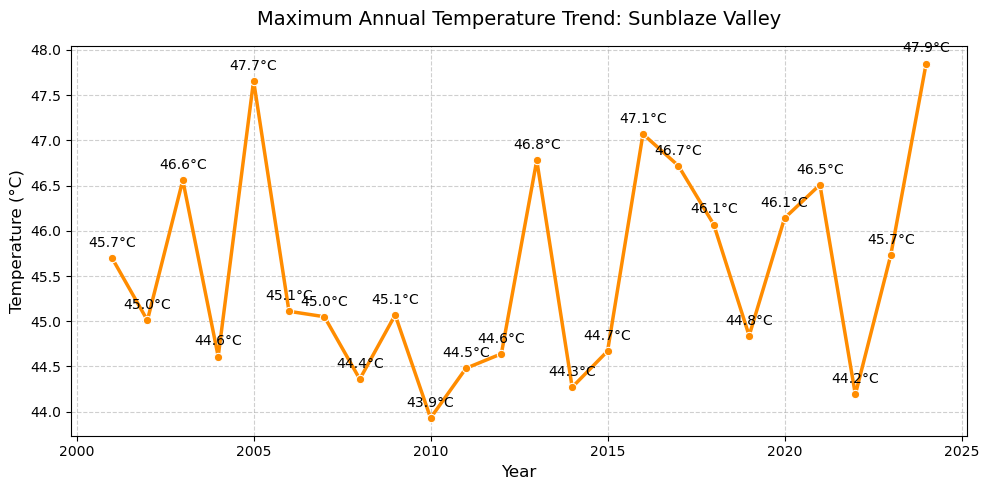

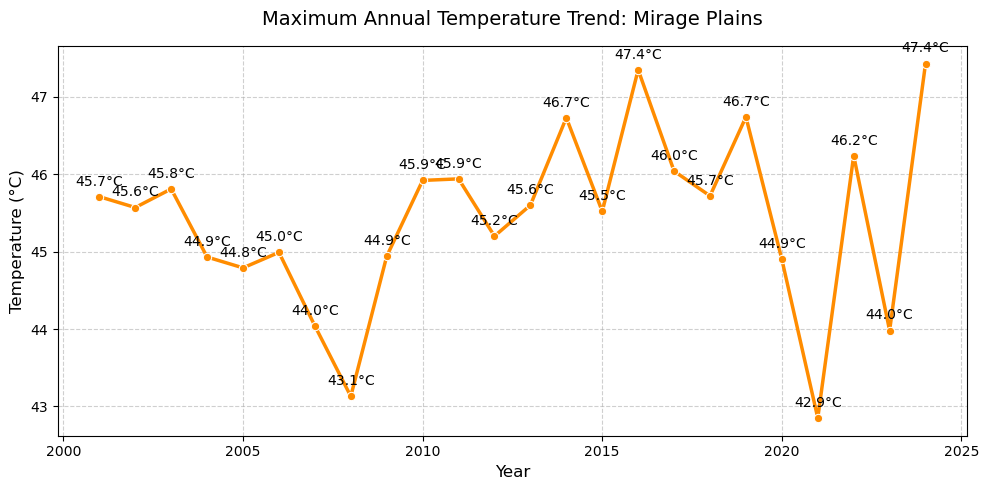

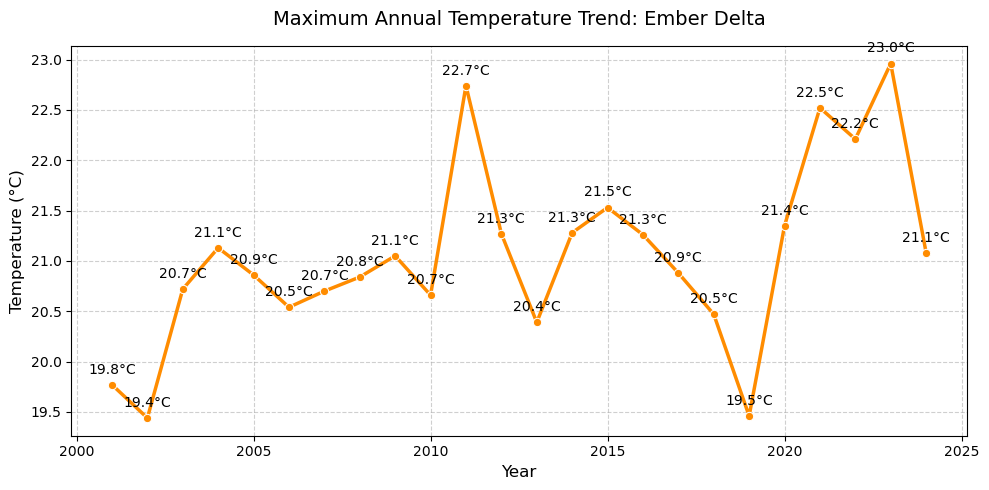

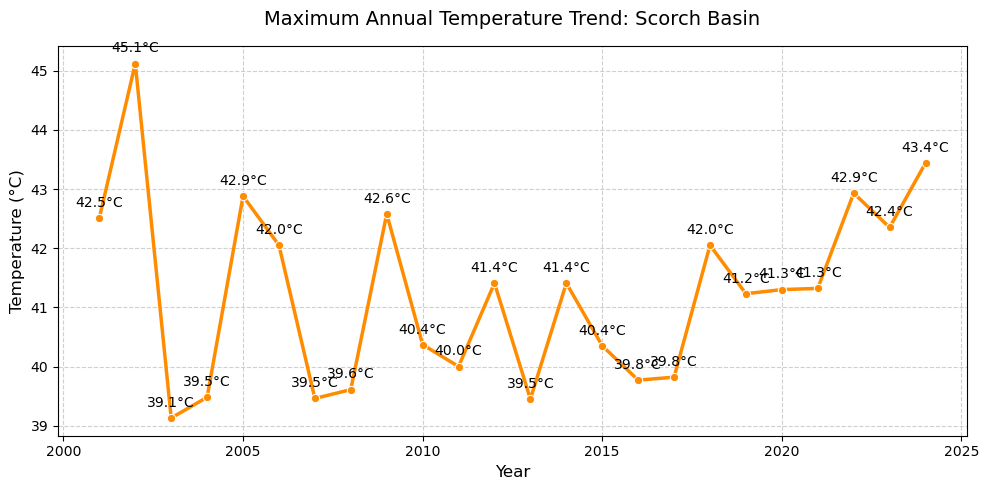

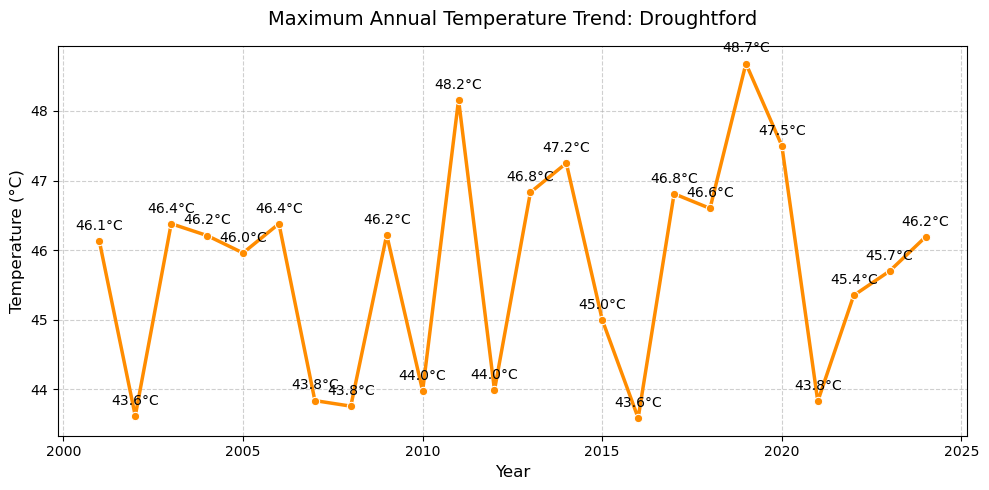

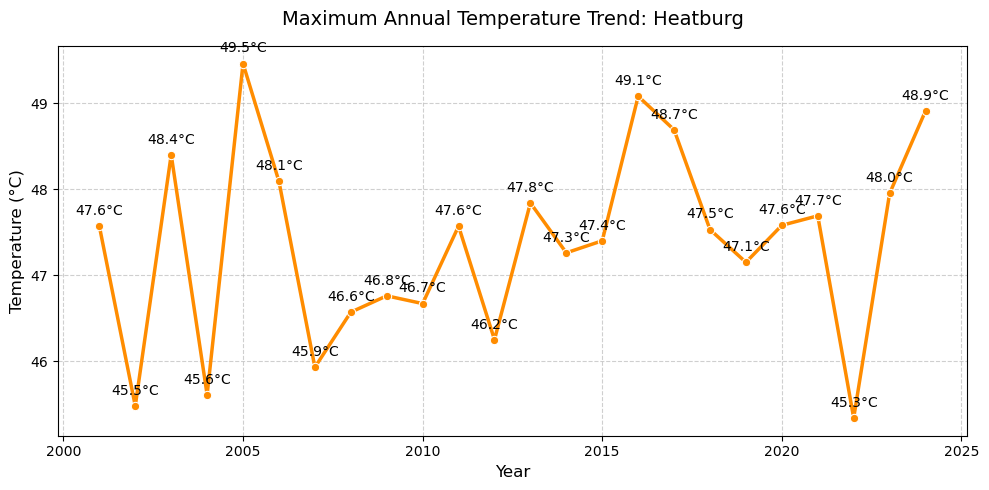

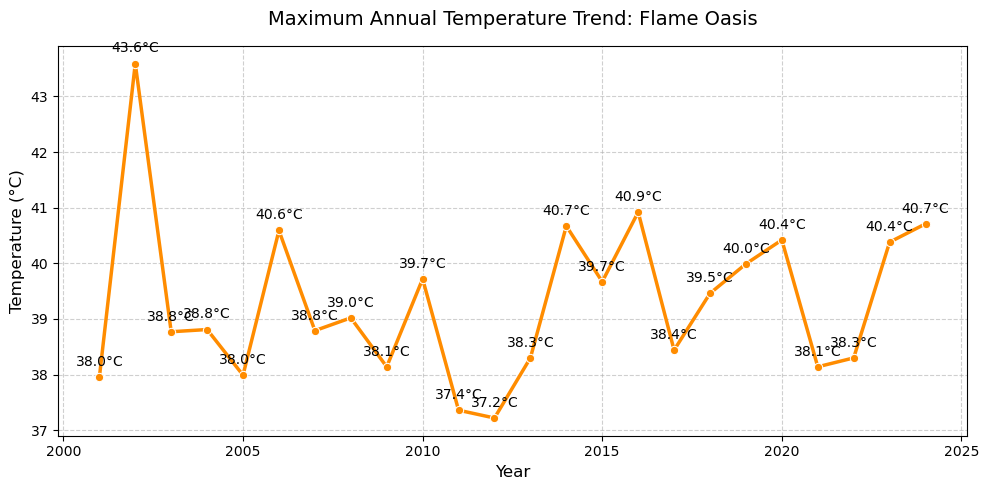

In [5]:
# Get unique region names from the dataset
regions_list = df["REGION"].unique()

# Loop through each region and generate plots
for selected_region in regions_list:
    # Filter data and compute MAXIMUM temperature stats
    region_temp = df[df["REGION"] == selected_region].groupby("YEAR")["T2M"].max().reset_index()
    
    # Create plot
    plt.figure(figsize=(10, 5))
    ax = sns.lineplot(data=region_temp, x="YEAR", y="T2M", 
                     marker="o", linewidth=2.5, color='darkorange')
    
    # Add annotations
    for x, y in zip(region_temp["YEAR"], region_temp["T2M"]):
        plt.annotate(f"{y:.1f}°C", (x, y), 
                     textcoords="offset points", 
                     xytext=(0,8), 
                     ha='center',
                     fontsize=10)
    
    # Style the plot
    plt.title(f"Maximum Annual Temperature Trend: {selected_region}", 
              fontsize=14, pad=15)
    plt.xlabel("Year", fontsize=12)
    plt.ylabel("Temperature (°C)", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    
    # Show each plot individually
    plt.tight_layout()
    plt.show()

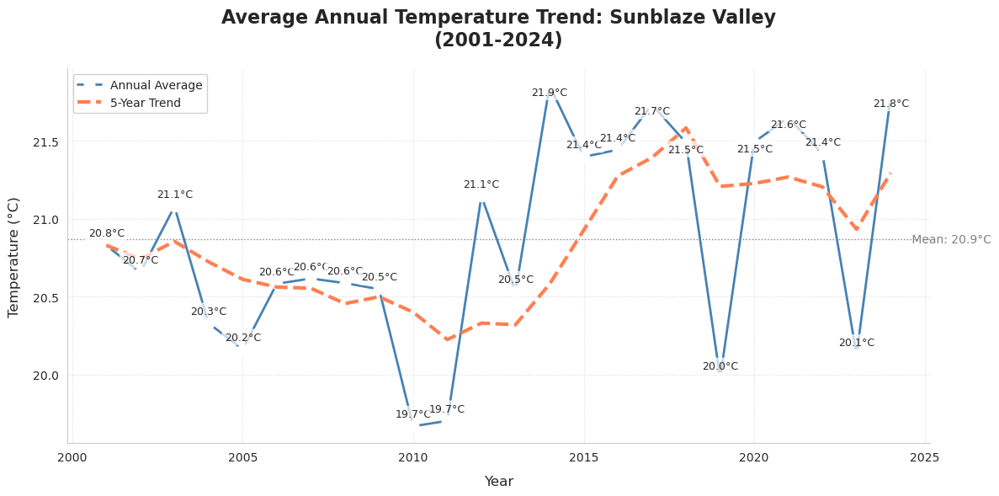

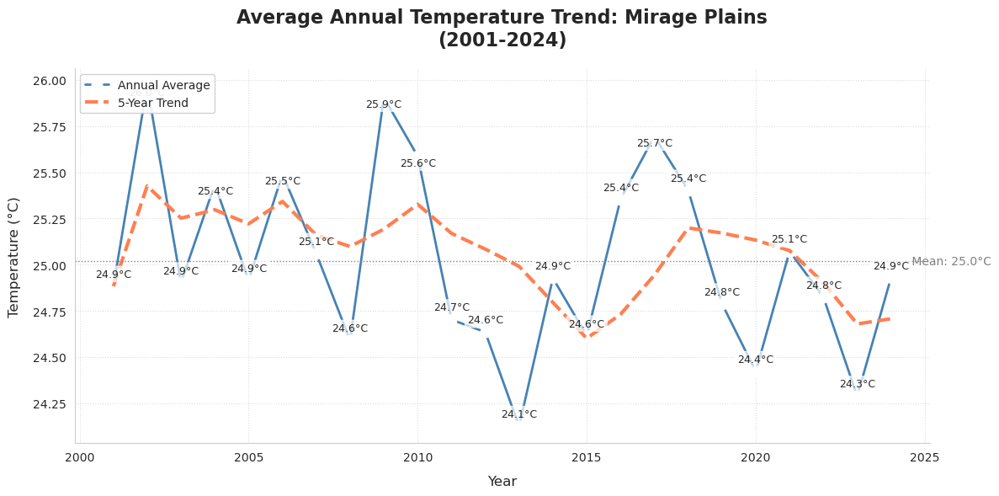

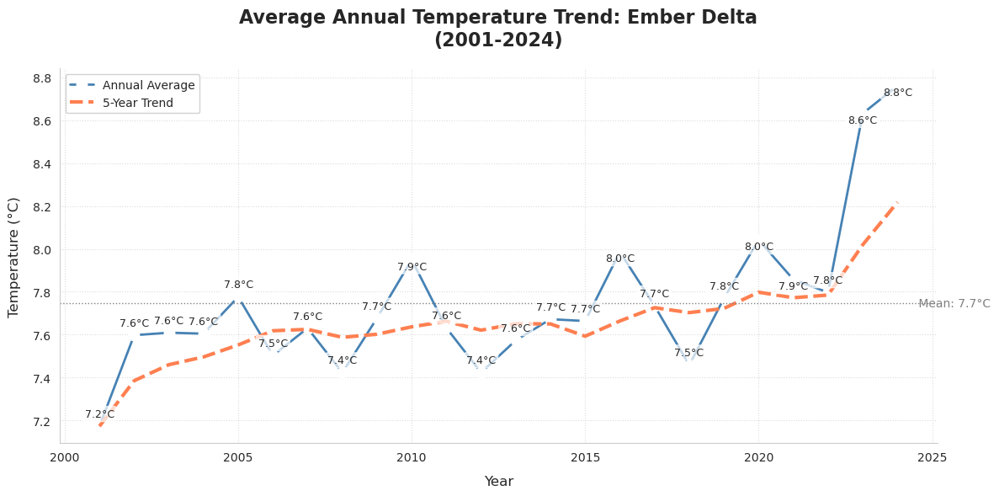

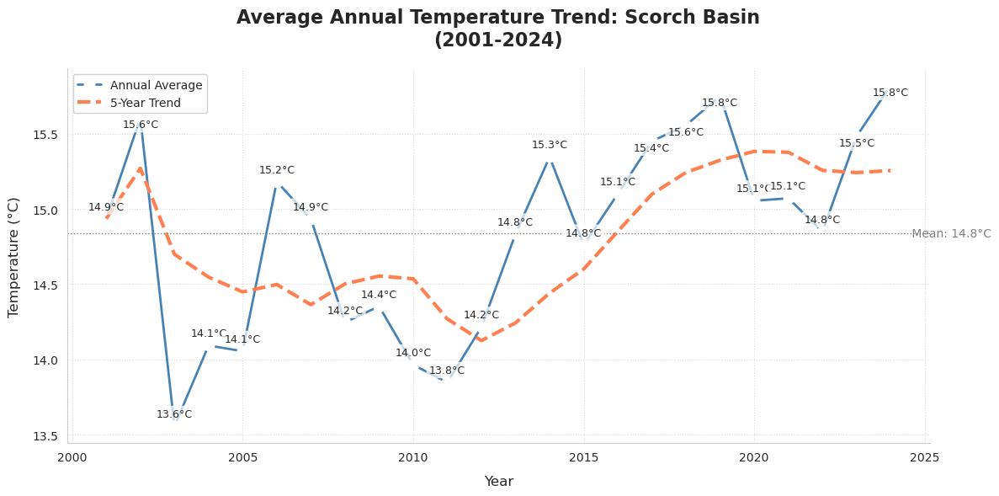

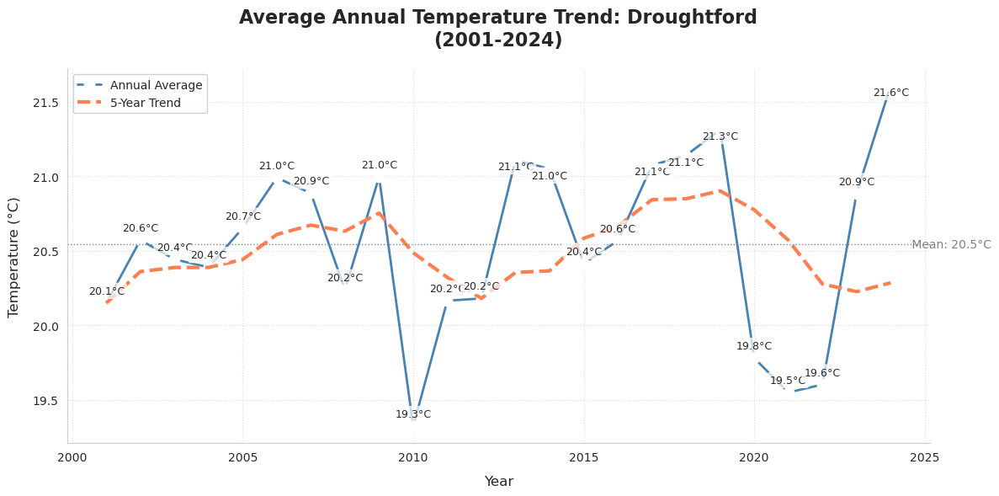

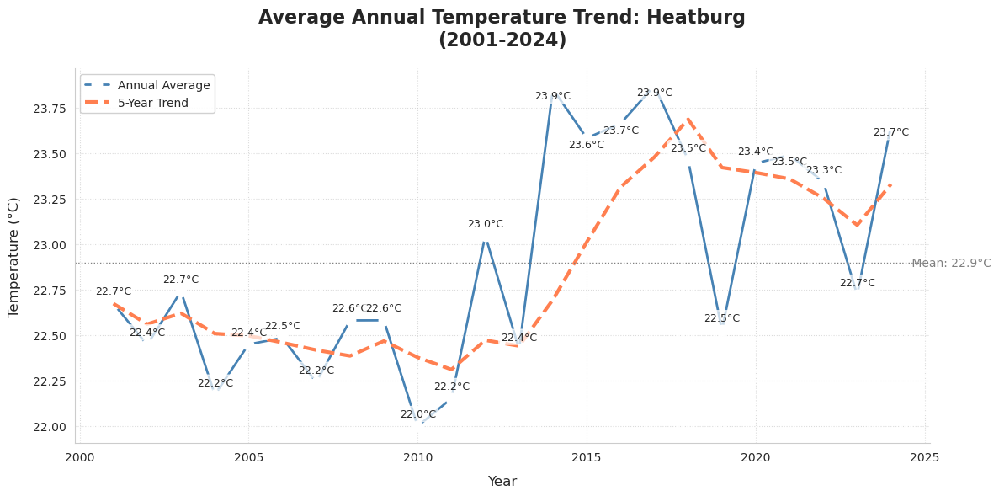

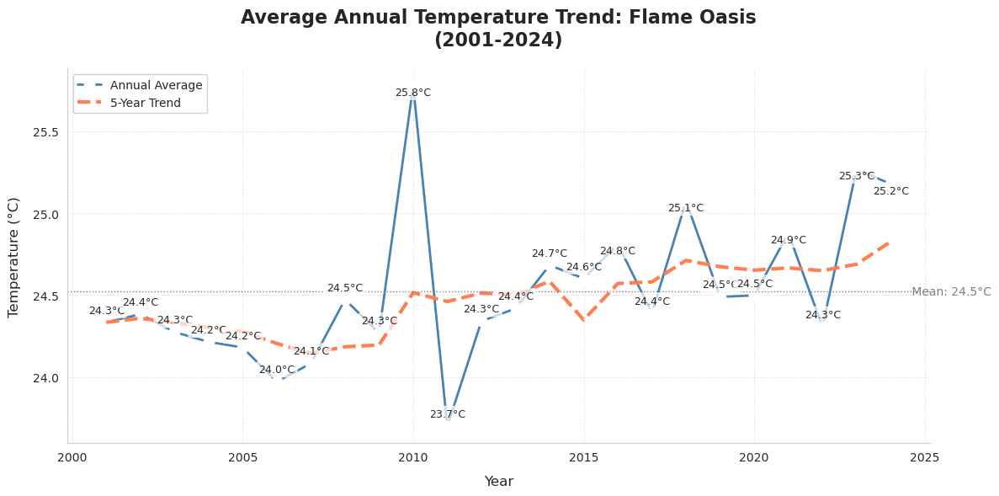

In [6]:
# Get unique region names from the dataset
regions_list = df["REGION"].unique()

# Set style for better visual appeal
sns.set_style("whitegrid")
plt.rcParams['font.family'] = 'DejaVu Sans'  # Ensures proper font rendering

# Loop through each region and generate plots
for selected_region in regions_list:
    # Filter data and compute AVERAGE temperature stats
    region_temp = df[df["REGION"] == selected_region].groupby("YEAR")["T2M"].mean().reset_index()
    
    # Calculate 5-year moving average for trend line
    region_temp['MA5'] = region_temp['T2M'].rolling(5, min_periods=1).mean()
    
    # Create plot with larger figure size
    plt.figure(figsize=(12, 6))
    
    # Plot main line with gradient coloring
    ax = sns.lineplot(data=region_temp, x="YEAR", y="T2M", 
                     marker="o", linewidth=2, color='steelblue',
                     markersize=8, markerfacecolor='white',
                     markeredgewidth=2, label='Annual Average')
    
    # Add trend line
    sns.lineplot(data=region_temp, x="YEAR", y="MA5", 
                linewidth=3, color='coral', linestyle='--',
                label='5-Year Trend')
    
    # Add annotations with improved positioning
    for x, y in zip(region_temp["YEAR"], region_temp["T2M"]):
        va = 'bottom' if y < np.percentile(region_temp["T2M"], 75) else 'top'
        offset = 8 if va == 'bottom' else -8
        plt.annotate(f"{y:.1f}°C", (x, y), 
                    textcoords="offset points", 
                    xytext=(0, offset), 
                    ha='center',
                    fontsize=9,
                    bbox=dict(boxstyle='round,pad=0.2', 
                             fc='white', 
                             alpha=0.7))
    
    # Enhanced styling
    plt.title(f"Average Annual Temperature Trend: {selected_region}\n(2001-2024)", 
             fontsize=16, pad=20, fontweight='bold')
    plt.xlabel("Year", fontsize=12, labelpad=10)
    plt.ylabel("Temperature (°C)", fontsize=12, labelpad=10)
    
    # Customize grid and spines
    ax.grid(True, linestyle=':', alpha=0.7)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Add climate context annotation
    avg_temp = region_temp["T2M"].mean()
    plt.axhline(y=avg_temp, color='gray', linestyle=':', linewidth=1)
    plt.text(region_temp["YEAR"].max()+0.5, avg_temp, 
            f' Mean: {avg_temp:.1f}°C', 
            va='center', ha='left', color='gray')
    
    # Add legend in best location
    plt.legend(loc='upper left', frameon=True, framealpha=0.9)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

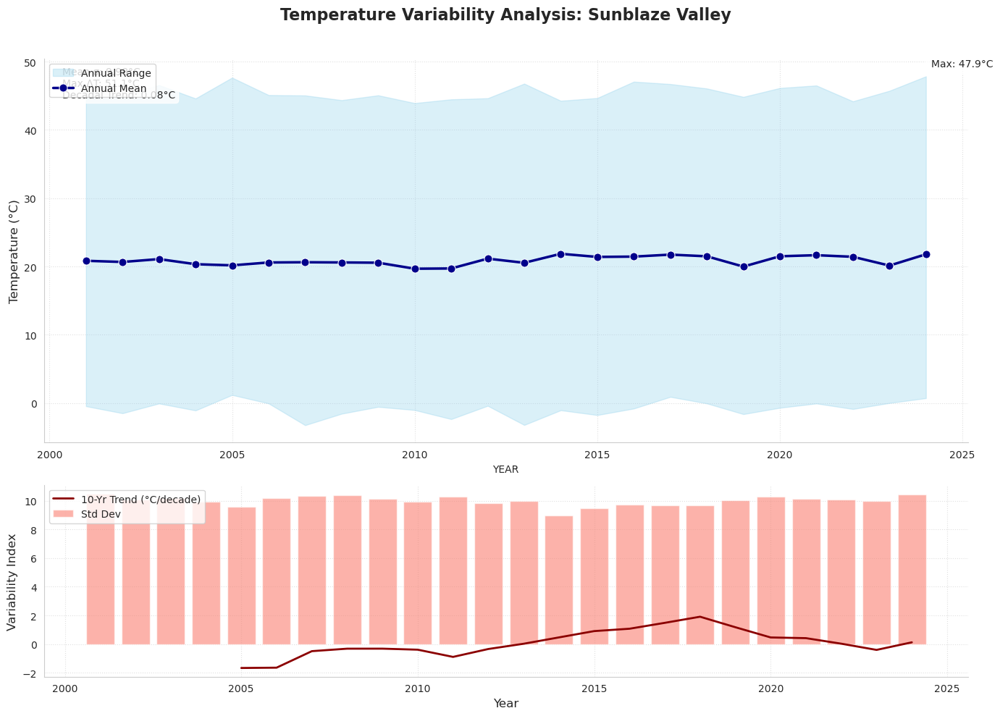

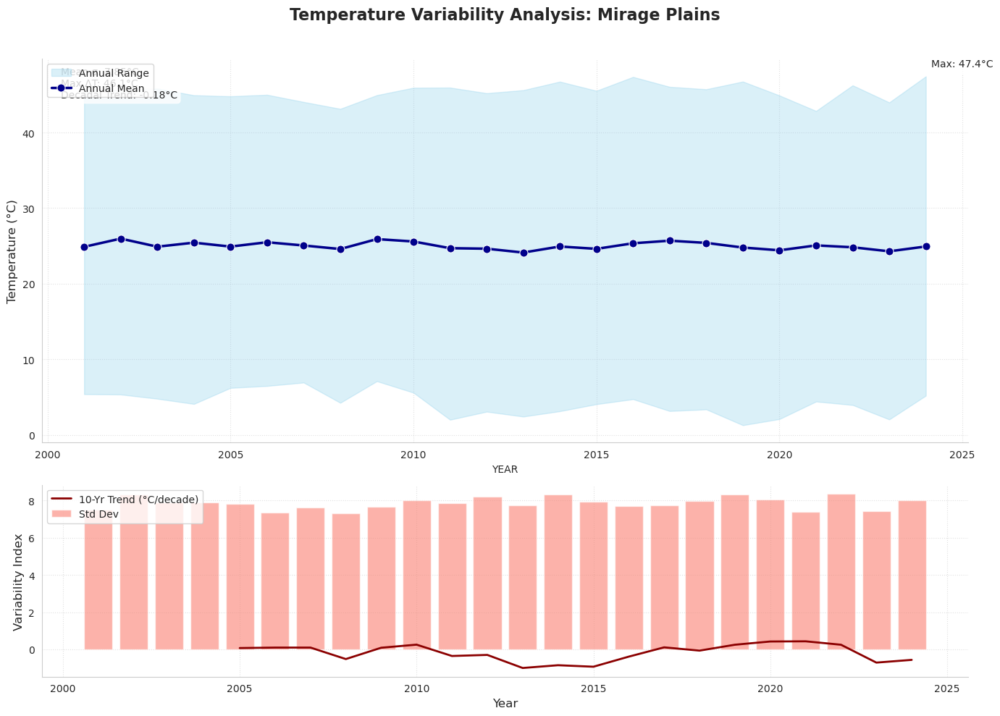

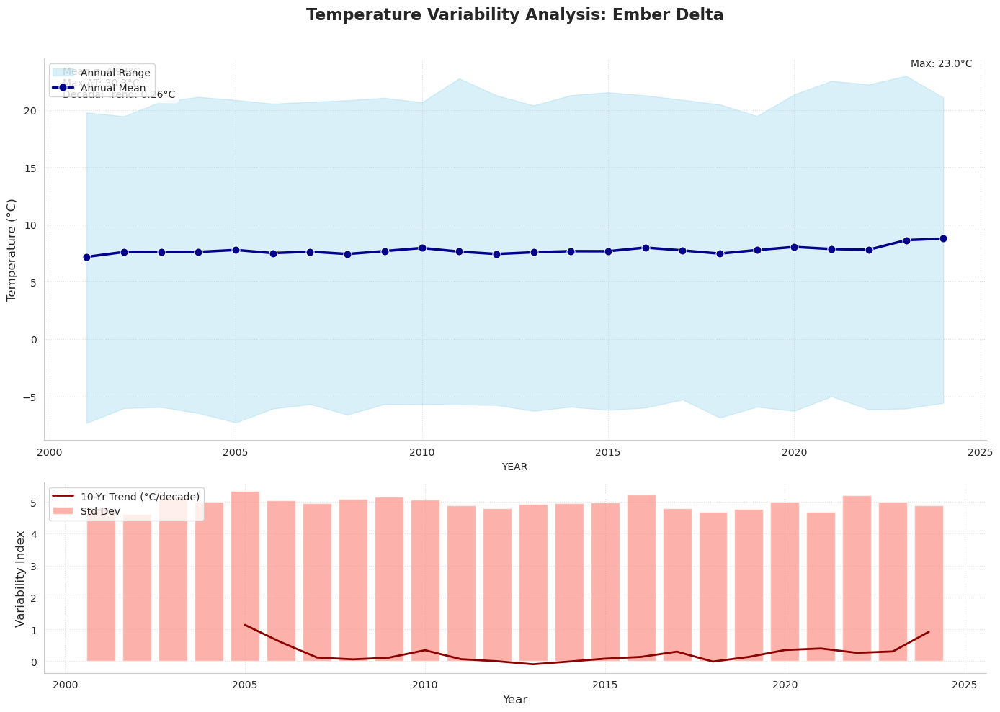

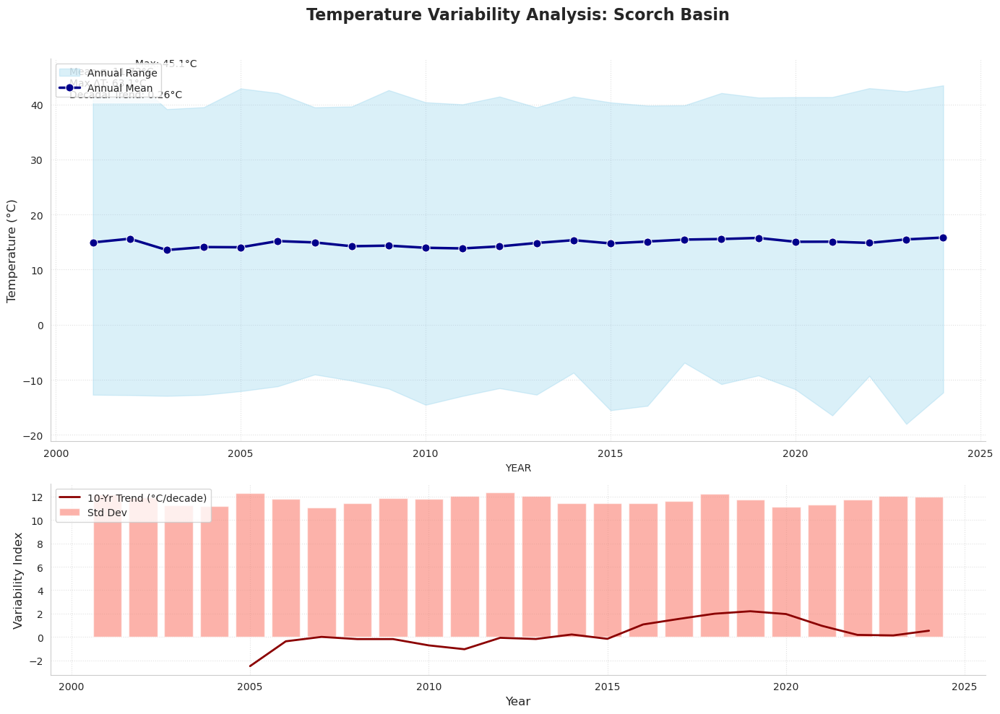

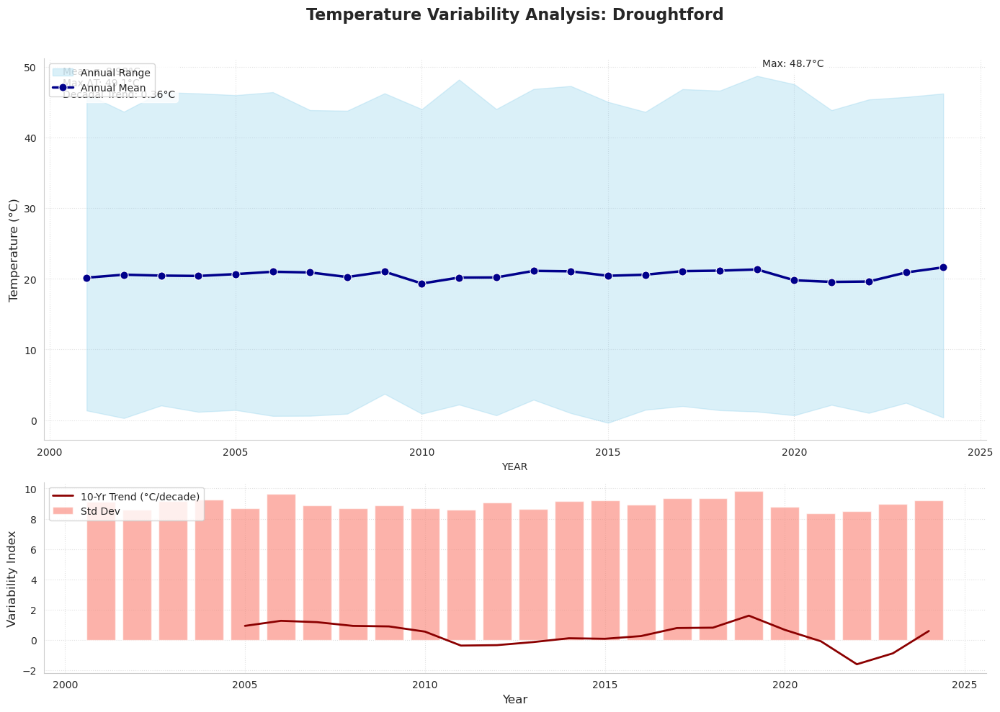

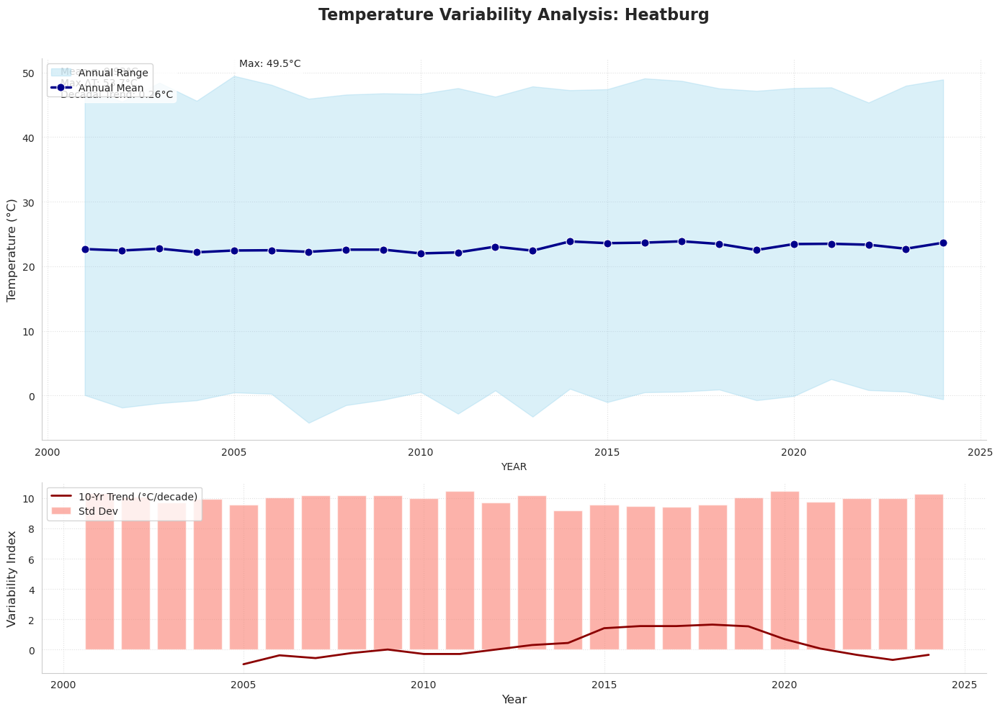

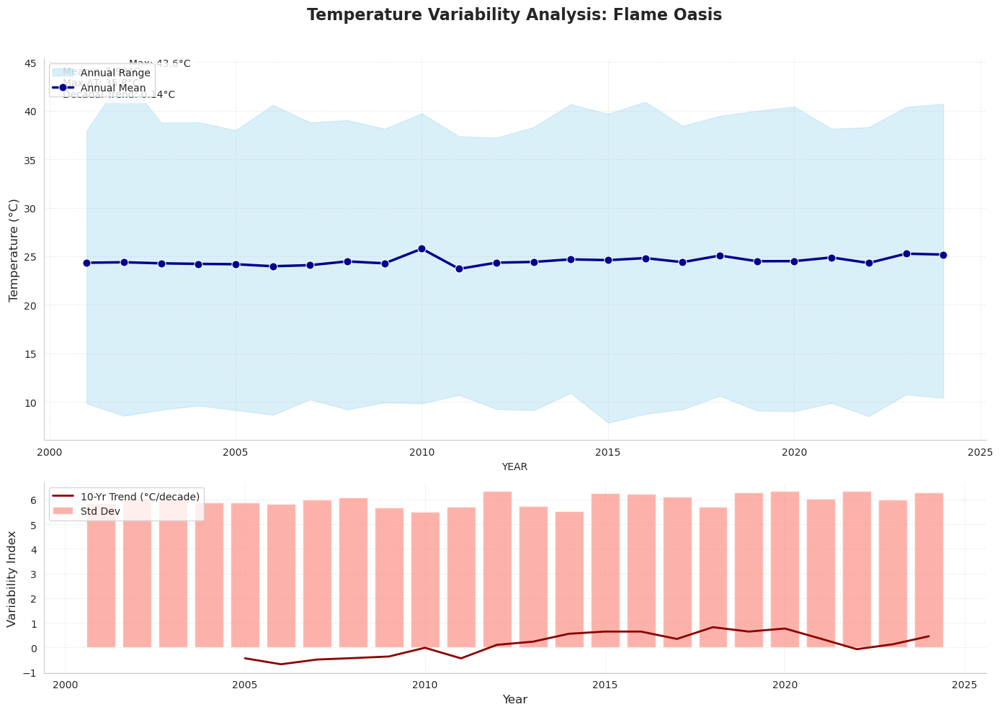

In [7]:
# Set visual style
sns.set_style("whitegrid")
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['axes.titlepad'] = 20

# Get unique regions
regions_list = df["REGION"].unique()

for region in regions_list:
    # Filter and calculate metrics
    region_df = df[df["REGION"] == region]
    annual_stats = region_df.groupby("YEAR")["T2M"].agg(['mean', 'max', 'min', 'std']).reset_index()
    
    # Calculate 10-year trend (Sen's slope)
    def sens_slope(y):
        x = np.arange(len(y))
        return stats.theilslopes(y, x)[0]
    
    trend_10yr = annual_stats['mean'].rolling(10, min_periods=5).apply(sens_slope, raw=True)
    
    # Create figure with subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10), 
                                gridspec_kw={'height_ratios': [2, 1]})
    
    # --- Top Plot: Temperature Range ---
    ax1.fill_between(annual_stats["YEAR"], 
                    annual_stats["min"], 
                    annual_stats["max"],
                    color='skyblue', alpha=0.3, label='Annual Range')
    
    sns.lineplot(data=annual_stats, x="YEAR", y="mean", 
                ax=ax1, color='darkblue', linewidth=2.5,
                marker='o', markersize=8, label='Annual Mean')
    
    # Annotate extremes
    max_temp = annual_stats.loc[annual_stats['max'].idxmax()]
    min_temp = annual_stats.loc[annual_stats['min'].idxmin()]
    ax1.annotate(f'Max: {max_temp["max"]:.1f}°C', 
                xy=(max_temp["YEAR"], max_temp["max"]),
                xytext=(5,10), textcoords='offset points',
                bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))
    
    # --- Bottom Plot: Variability Metrics ---
    ax2.bar(annual_stats["YEAR"], annual_stats["std"],
           color='salmon', alpha=0.6, label='Std Dev')
    
    sns.lineplot(x=annual_stats["YEAR"], y=trend_10yr*10,  # Scale for visibility
                ax=ax2, color='darkred', linewidth=2,
                label='10-Yr Trend (°C/decade)')
    
    # --- Common Styling ---
    for ax in [ax1, ax2]:
        ax.grid(True, linestyle=':', alpha=0.6)
        ax.spines[['top','right']].set_visible(False)
    
    # Titles and labels
    ax1.set_title(f'Temperature Variability Analysis: {region}\n', fontsize=16, fontweight='bold')
    ax1.set_ylabel('Temperature (°C)', fontsize=12)
    ax2.set_xlabel('Year', fontsize=12)
    ax2.set_ylabel('Variability Index', fontsize=12)
    
    # Legends
    ax1.legend(loc='upper left', frameon=True)
    ax2.legend(loc='upper left', frameon=True)
    
    # Annotate stats
    stats_text = (f"Mean σ: {annual_stats['std'].mean():.2f}°C\n"
                 f"Max ΔT: {annual_stats['max'].max()-annual_stats['min'].min():.1f}°C\n"
                 f"Decadal Trend: {trend_10yr.mean()*10:.2f}°C")
    ax1.text(0.02, 0.98, stats_text,
            transform=ax1.transAxes, va='top', ha='left',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.show()

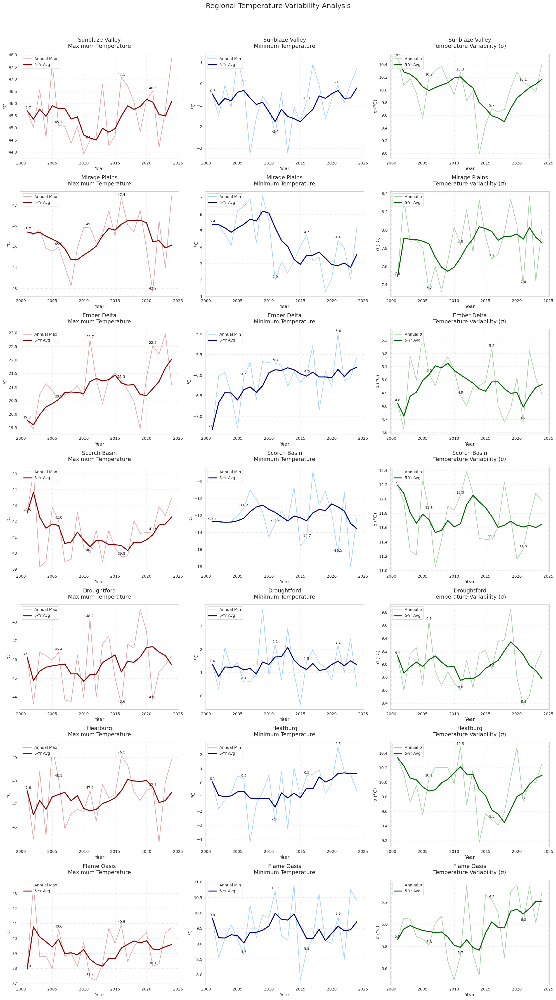

In [8]:
# Set style for better visual appeal
sns.set_style("whitegrid")
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['axes.titlepad'] = 15

# Get unique regions
regions_list = df["REGION"].unique()

# Create a figure with subplots for each region
fig, axes = plt.subplots(len(regions_list), 3, figsize=(20, 5*len(regions_list)))
fig.suptitle("Regional Temperature Variability Analysis", fontsize=18, y=1.02)

# Loop through each region
for i, region in enumerate(regions_list):
    # Filter data for the region
    region_data = df[df["REGION"] == region]
    
    # Calculate annual statistics
    annual_stats = region_data.groupby("YEAR").agg(
        max_temp=("T2M", "max"),
        min_temp=("T2M", "min"), 
        temp_variability=("T2M", "std")
    ).reset_index()
    
    # Calculate 5-year moving averages
    for col in ['max_temp', 'min_temp', 'temp_variability']:
        annual_stats[f'{col}_ma5'] = annual_stats[col].rolling(5, min_periods=1).mean()
    
    # --- Max Temperature Plot ---
    sns.lineplot(ax=axes[i,0], data=annual_stats, x="YEAR", y="max_temp", 
                color="firebrick", alpha=0.4, label='Annual Max')
    sns.lineplot(ax=axes[i,0], data=annual_stats, x="YEAR", y="max_temp_ma5", 
                color="darkred", linewidth=2.5, label='5-Yr Avg')
    axes[i,0].set_title(f"{region}\nMaximum Temperature", fontsize=14)
    axes[i,0].set_ylabel("°C", fontsize=12)
    
    # --- Min Temperature Plot ---
    sns.lineplot(ax=axes[i,1], data=annual_stats, x="YEAR", y="min_temp", 
                color="dodgerblue", alpha=0.4, label='Annual Min')
    sns.lineplot(ax=axes[i,1], data=annual_stats, x="YEAR", y="min_temp_ma5", 
                color="navy", linewidth=2.5, label='5-Yr Avg')
    axes[i,1].set_title(f"{region}\nMinimum Temperature", fontsize=14)
    axes[i,1].set_ylabel("°C", fontsize=12)
    
    # --- Variability Plot ---
    sns.lineplot(ax=axes[i,2], data=annual_stats, x="YEAR", y="temp_variability", 
                color="forestgreen", alpha=0.4, label='Annual σ')
    sns.lineplot(ax=axes[i,2], data=annual_stats, x="YEAR", y="temp_variability_ma5", 
                color="darkgreen", linewidth=2.5, label='5-Yr Avg')
    axes[i,2].set_title(f"{region}\nTemperature Variability (σ)", fontsize=14)
    axes[i,2].set_ylabel("σ (°C)", fontsize=12)
    
    # Add grid and style for all subplots
    for j in range(3):
        axes[i,j].set_xlabel("Year", fontsize=12)
        axes[i,j].grid(True, linestyle=':', alpha=0.6)
        axes[i,j].legend(loc='upper left')
        
        # Add value annotations for every 5 years
        for x, y in zip(annual_stats["YEAR"][::5], annual_stats.iloc[::5, j+1]):
            axes[i,j].annotate(f"{y:.1f}", (x, y), 
                             textcoords="offset points", 
                             xytext=(0,5), ha='center', fontsize=9)

plt.tight_layout()
plt.show()

# 2. Rain Probability Calculation

### Meteorological Basis
Calculates probability using surface-level weather conditions:
- **High Humidity**: RH₂ₘ > 85%  
  _(Moist air favors precipitation)_
- **Near-Saturation**: (T₂ₘ - T₂ₘDew) < 2°C  
  _(Small temp-dew point gap indicates saturation)_

### Calculation Steps
```python
# Daily Rain Condition
df["Rainy_Day"] = (df["RH2M"] > 85) & ((df["T2M"] - df["T2MDEW"]) < 2)

# Annual Probability
rain_prob = (df.groupby(["REGION","YEAR"])["Rainy_Day"]
             .mean()
             .mul(100)
             .round(1))

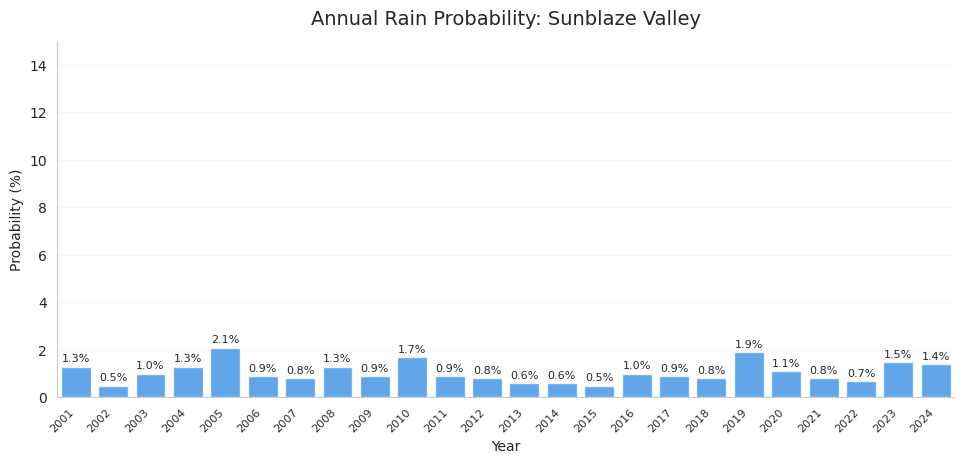

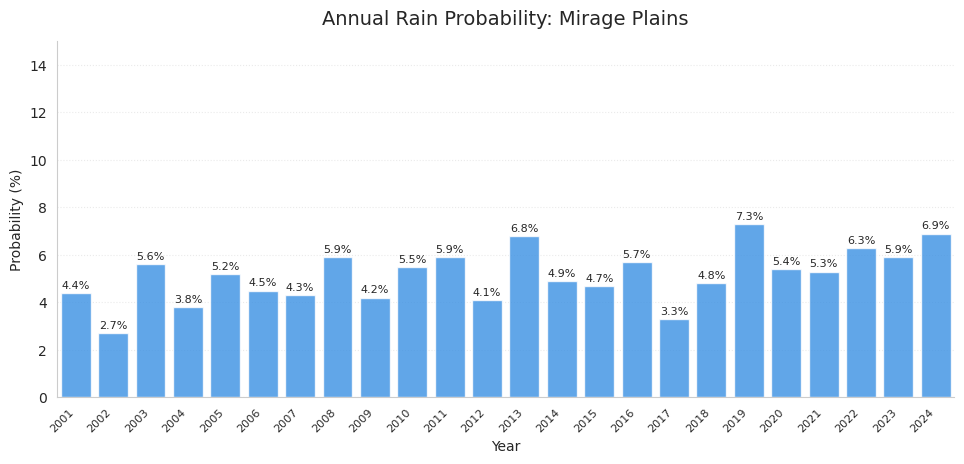

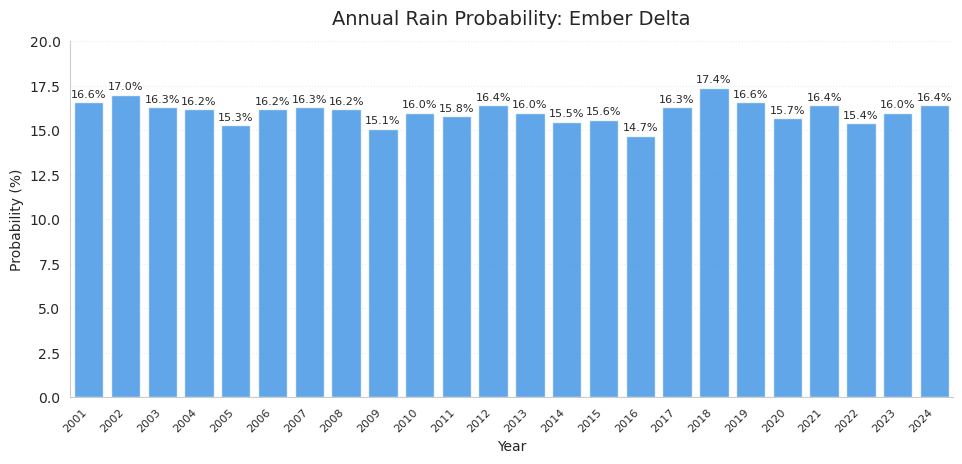

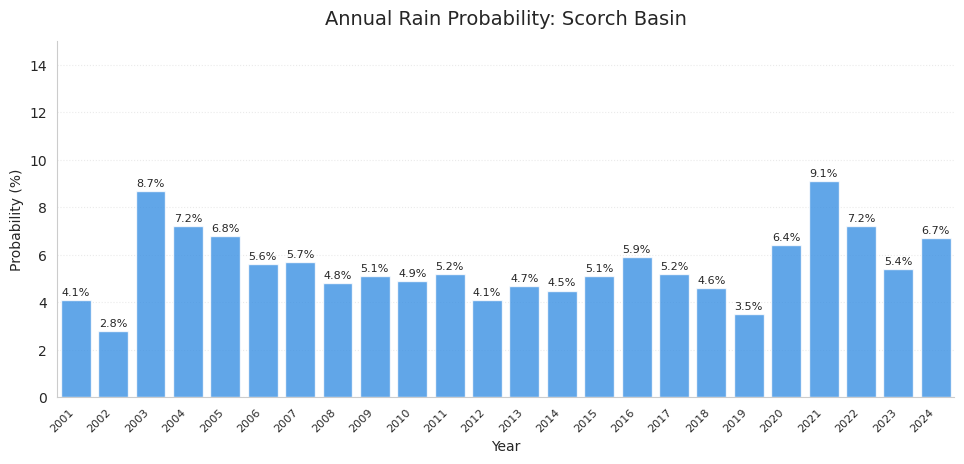

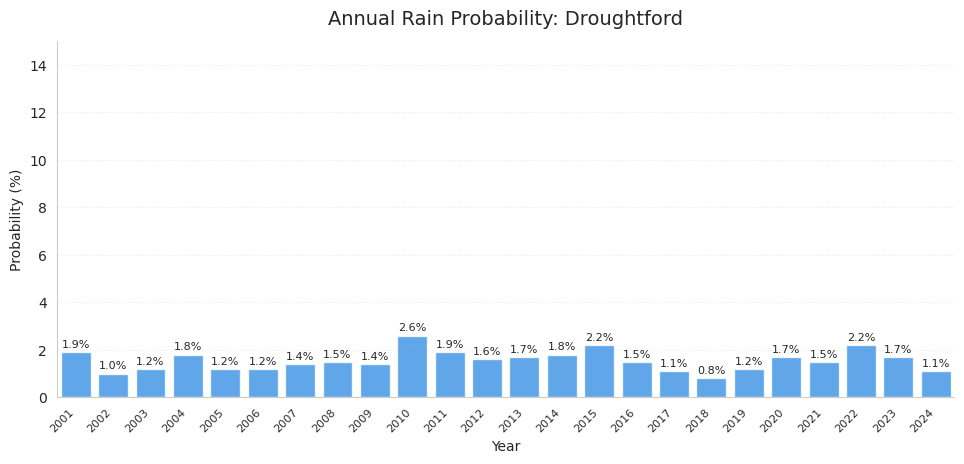

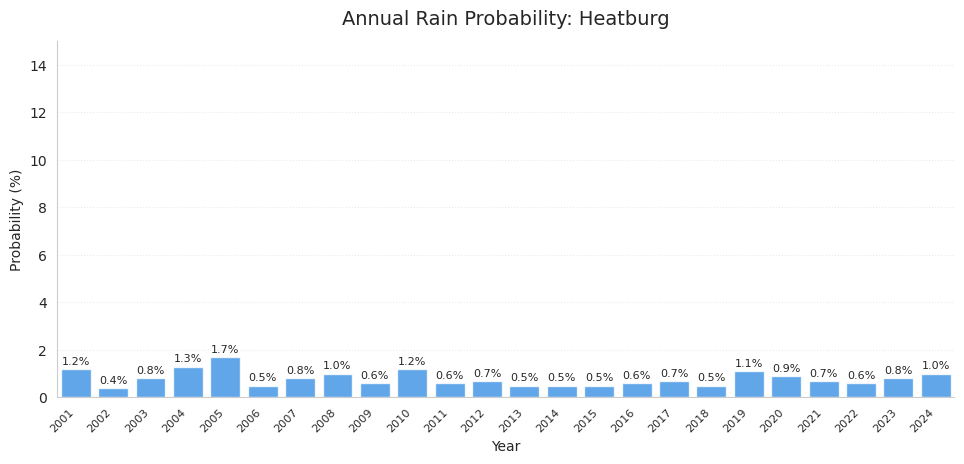

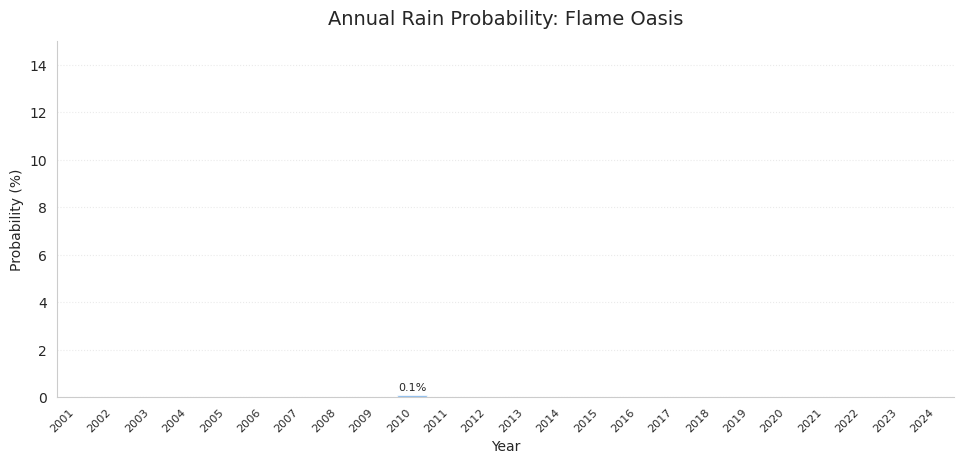

In [9]:
def plot_rain_probability(df):
    """
    Calculate and plot rain probability by region and year as column plots
    with properly formatted x-axis years and optimized layout.
    """
    try:
        # Calculate rainy days
        df["Rainy_Day"] = ((df["RH2M"] > 85) & ((df["T2M"] - df["T2MDEW"]) < 2))
        
        # Get unique regions
        regions_list = df["REGION"].unique()
        
        # Loop through each region
        for selected_region in regions_list:
            # Filter data and compute rain probability
            region_data = df[df["REGION"] == selected_region]
            rain_prob = region_data.groupby("YEAR")["Rainy_Day"].mean().reset_index()
            rain_prob["Rain_Probability"] = (rain_prob["Rainy_Day"] * 100).round(1)
            
            # Create plot
            plt.figure(figsize=(10, 5))
            ax = sns.barplot(data=rain_prob, x="YEAR", y="Rain_Probability",
                           color='dodgerblue', alpha=0.8)
            
            # Proper x-axis tick handling
            years = rain_prob["YEAR"].unique()
            tick_positions = np.arange(len(years))
            ax.set_xticks(tick_positions)  # Set fixed tick positions
            ax.set_xticklabels(years, rotation=45, ha='right', fontsize=8)
            
            # Add compact value labels
            for p in ax.patches:
                if p.get_height() > 0:  # Only label visible bars
                    ax.annotate(
                        f"{p.get_height():.1f}%",
                        (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center',
                        va='bottom',
                        xytext=(0, 2),  # Small vertical offset
                        textcoords='offset points',
                        fontsize=8
                    )
            
            # Style the plot
            plt.title(f"Annual Rain Probability: {selected_region}", 
                     fontsize=14, pad=12)
            plt.xlabel("Year", fontsize=10)
            plt.ylabel("Probability (%)", fontsize=10)
            
            # Light grid lines only on y-axis
            ax.yaxis.grid(True, linestyle=':', alpha=0.4)
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            
            # Set y-axis limits with minimal padding
            max_prob = rain_prob["Rain_Probability"].max()
            ax.set_ylim(0, min(105, max(15, max_prob * 1.15)))
            
            # Adjust layout
            plt.tight_layout(pad=2.0)
            plt.show()
            
    except Exception as e:
        print(f"Error in rain probability calculation: {str(e)}")
        import traceback
        traceback.print_exc()

# Call the function
plot_rain_probability(df)

# 3. UV Exposure Analysis

### Better Metrics for UV Exposure
1. **Peak UV Index** (Maximum daily exposure)
2. **High Exposure Days** (Days above UV Index 6)
3. **Seasonal Patterns** (Monthly averages)

Note: 2024 data removed due to potential measurement errors


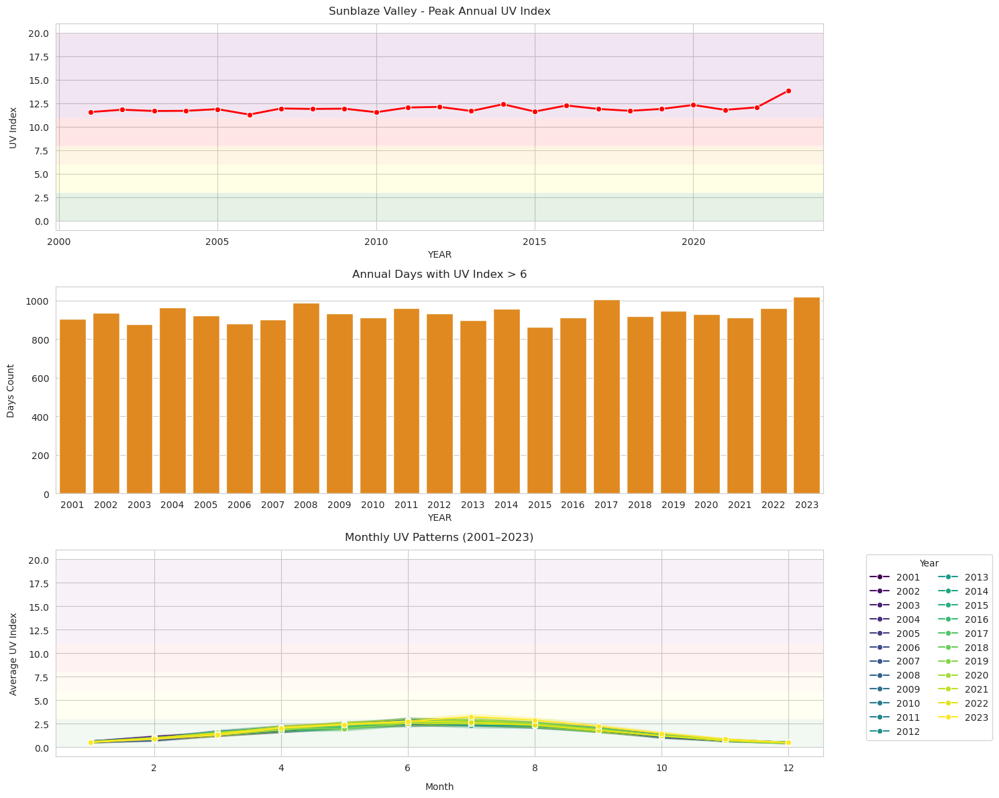

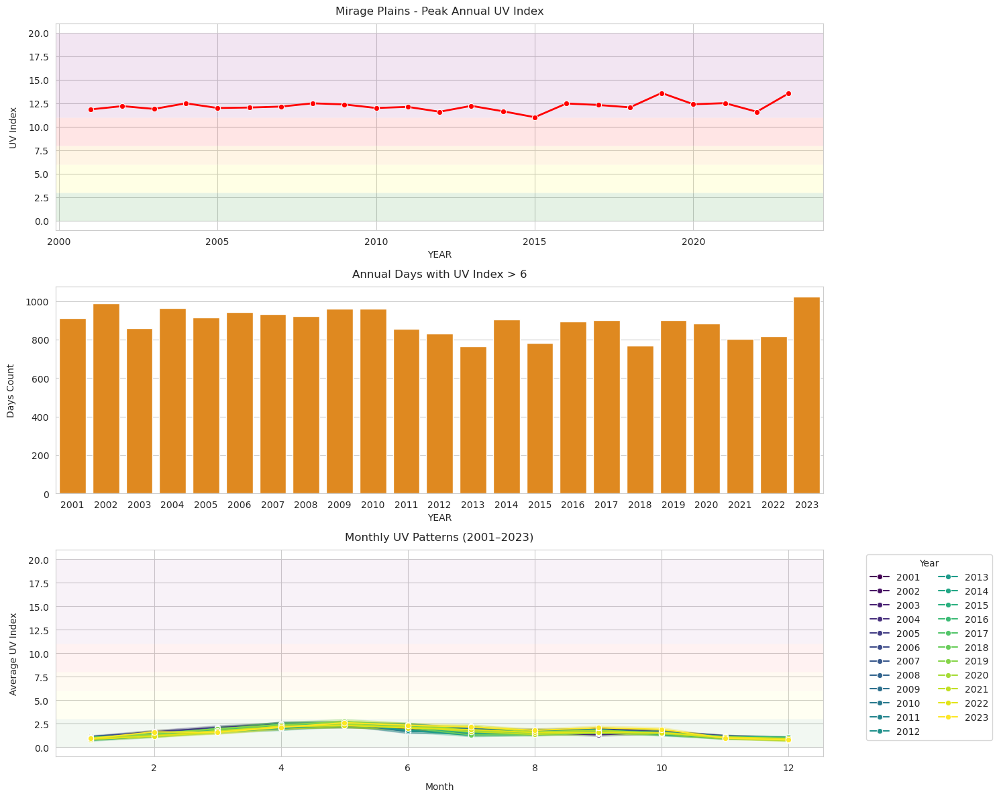

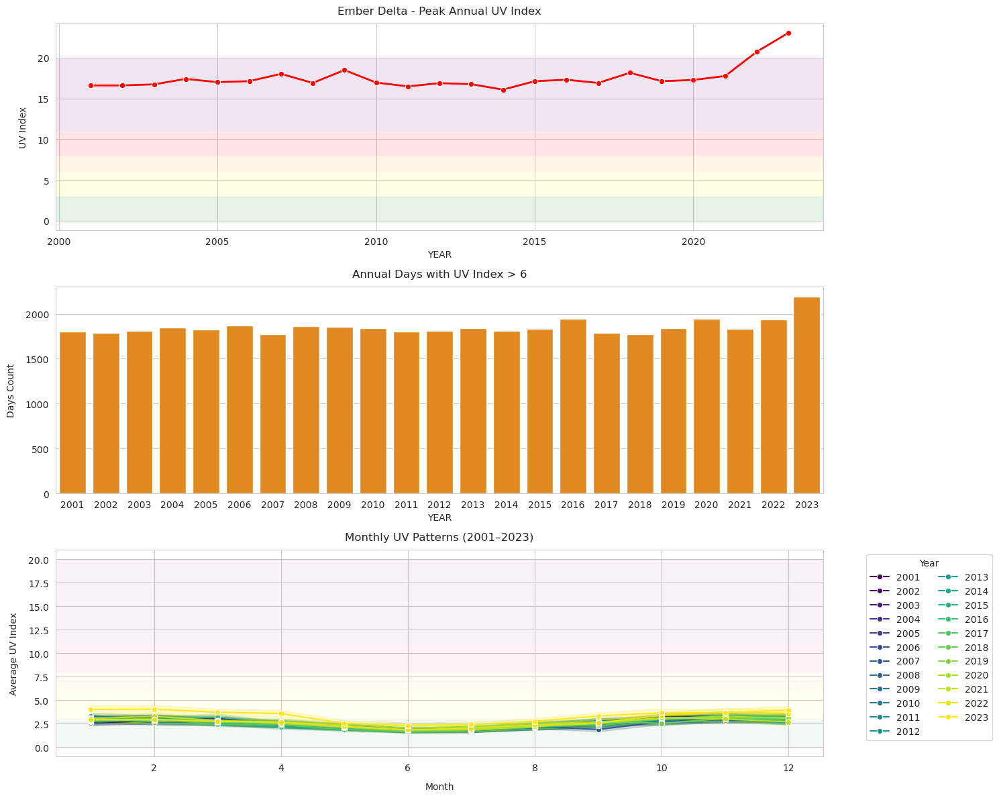

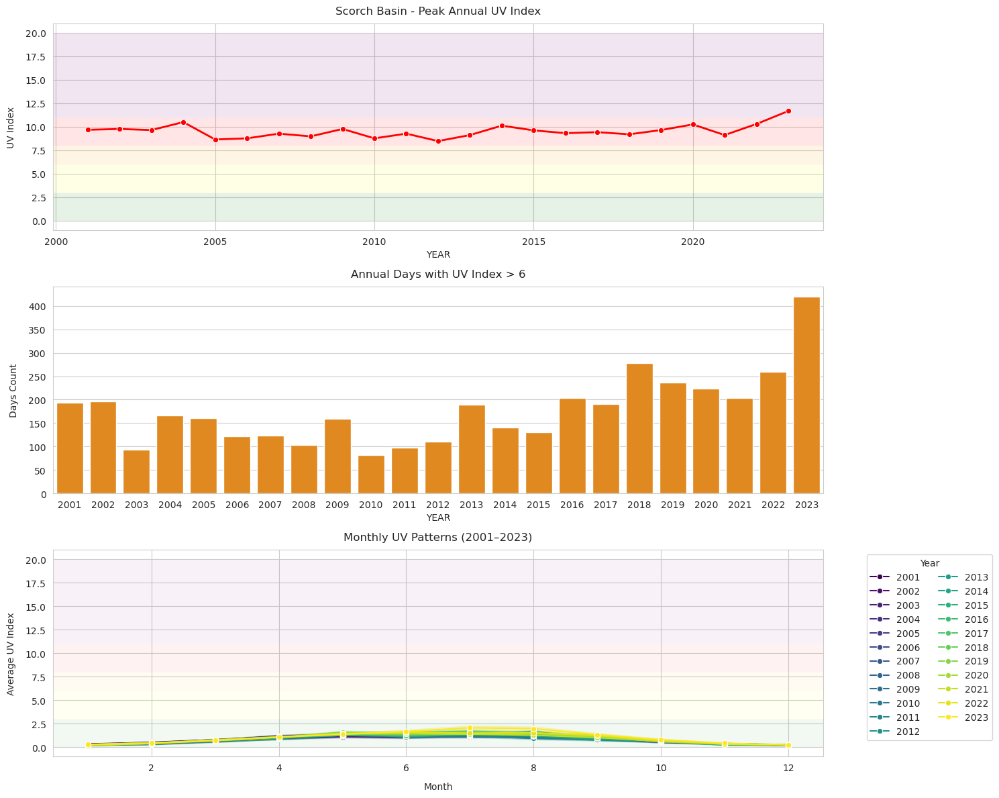

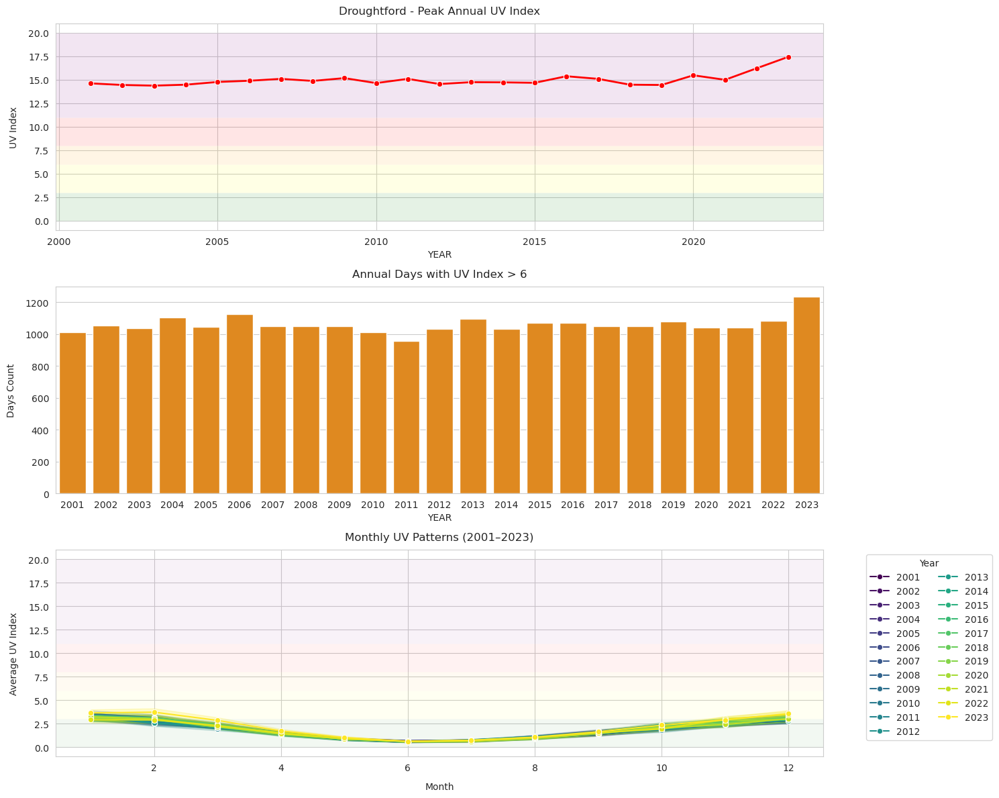

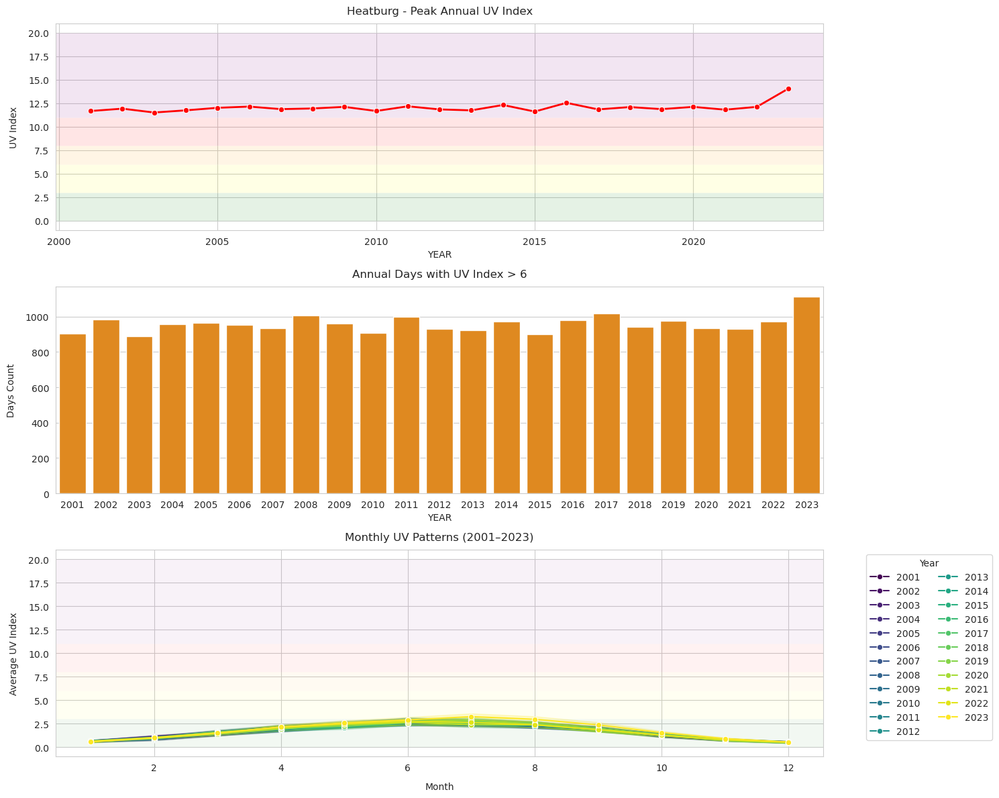

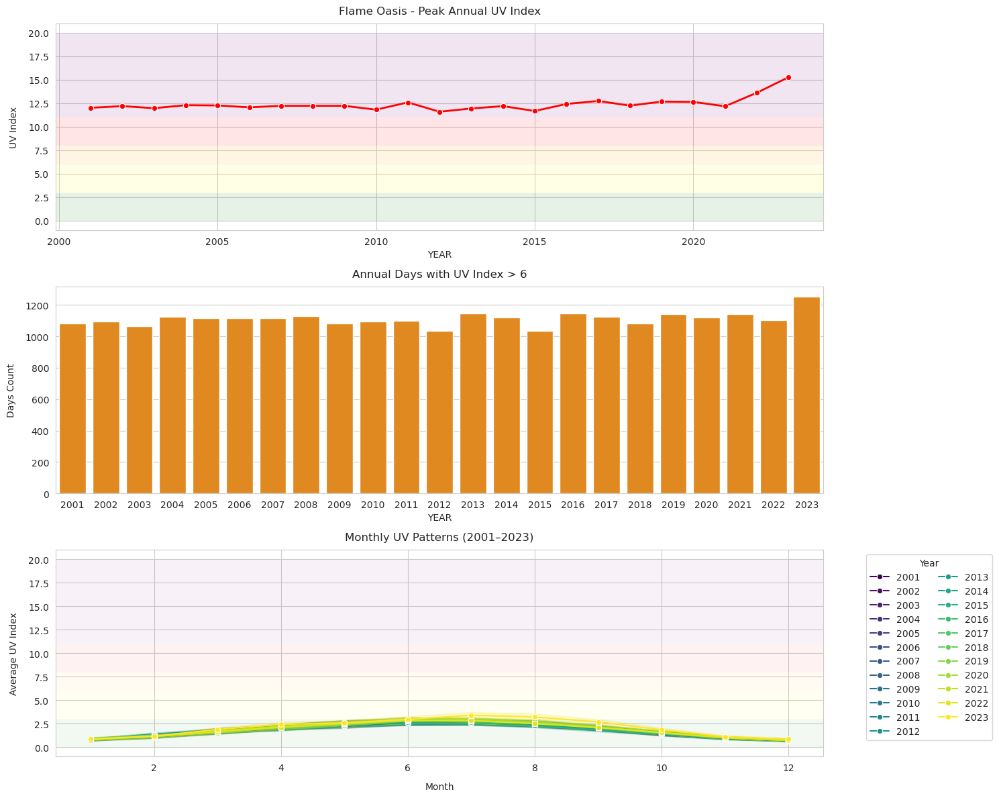

In [10]:
def plot_uv_exposure(df):
    try:
        df = df.copy()

        # Validate required columns
        required_cols = {"REGION", "YEAR", "MONTH", "ALLSKY_SFC_UV_INDEX"}
        if not required_cols.issubset(df.columns):
            raise ValueError(f"Missing required columns: {required_cols - set(df.columns)}")

        # Clean and validate UV index
        uv_col = "ALLSKY_SFC_UV_INDEX"
        df[uv_col] = df[uv_col].clip(lower=0)

        # Remove 2024 data
        if 2024 in df['YEAR'].unique():
            df = df[df['YEAR'] != 2024]
            print("Note: 2024 data removed due to potential measurement errors")

        # Filter only data from 2001 to 2023
        df = df[(df["YEAR"] >= 2001) & (df["YEAR"] <= 2023)]

        # Annual summary stats
        uv_stats = df.groupby(["REGION", "YEAR"]).agg(
            Peak_UV=(uv_col, 'max'),
            High_UV_Days=(uv_col, lambda x: (x > 6).sum()),
            Mean_UV=(uv_col, 'mean')
        ).reset_index()

        regions = df["REGION"].unique()
        for region in regions:
            region_data = uv_stats[uv_stats["REGION"] == region]
            monthly_data = df[df["REGION"] == region]

            if not region_data.empty:
                # Create figure with 3 subplots
                fig = plt.figure(figsize=(15, 12))
                gs = fig.add_gridspec(3, 1)
                ax1 = fig.add_subplot(gs[0, 0])
                ax2 = fig.add_subplot(gs[1, 0])
                ax3 = fig.add_subplot(gs[2, 0])

                # 1. Peak UV Plot
                sns.lineplot(data=region_data, x="YEAR", y="Peak_UV",
                             ax=ax1, color="red", marker="o", linewidth=2)
                ax1.set_title(f"{region} - Peak Annual UV Index", pad=10)
                ax1.set_ylabel("UV Index", labelpad=10)

                # 2. High UV Days
                sns.barplot(data=region_data.sort_values("YEAR"), x="YEAR", y="High_UV_Days",
                            ax=ax2, color="darkorange")
                ax2.set_title("Annual Days with UV Index > 6", pad=10)
                ax2.set_ylabel("Days Count", labelpad=10)

                # 3. Monthly Pattern (All years from 2001–2023)
                sns.lineplot(data=monthly_data, x="MONTH", y=uv_col,
                             hue="YEAR", palette="viridis", marker="o",
                             ax=ax3, linewidth=1.5, legend="full")
                ax3.set_title("Monthly UV Patterns (2001–2023)", pad=10)
                ax3.set_ylabel("Average UV Index", labelpad=10)
                ax3.set_xlabel("Month", labelpad=10)
                ax3.legend(title="Year", bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)  


                # Add UV risk zones
                risk_zones = [
                    (0, 3, 'Low', 'green'),
                    (3, 6, 'Moderate', 'yellow'),
                    (6, 8, 'High', 'orange'),
                    (8, 11, 'Very High', 'red'),
                    (11, 20, 'Extreme', 'purple')
                ]

                for lower, upper, label, color in risk_zones:
                    ax1.axhspan(lower, upper, facecolor=color, alpha=0.1)
                    ax3.axhspan(lower, upper, facecolor=color, alpha=0.05)

                plt.tight_layout()
                plt.show()
            else:
                print(f"No UV data available for {region}")

    except Exception as e:
        print(f"Error in UV exposure calculation: {str(e)}")

plot_uv_exposure(df)

# 4. Wind Speed vs Temperature Analysis by Region

### Enhanced Scatterplots Showing:
- **Wind-Temperature Relationship** for each region
- **Humidity** encoded as color (coolwarm scale)
- **Properly formatted** colorbars and labels


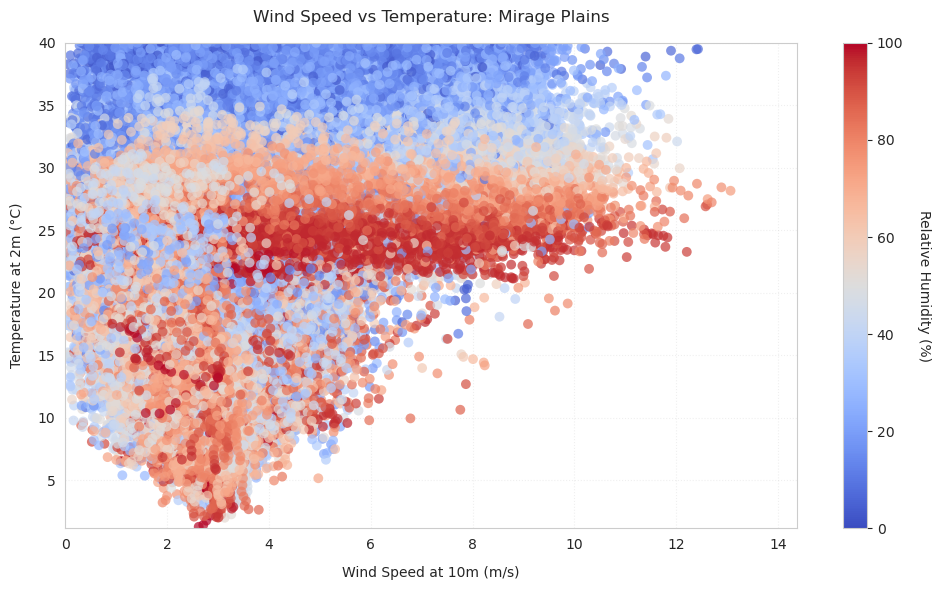

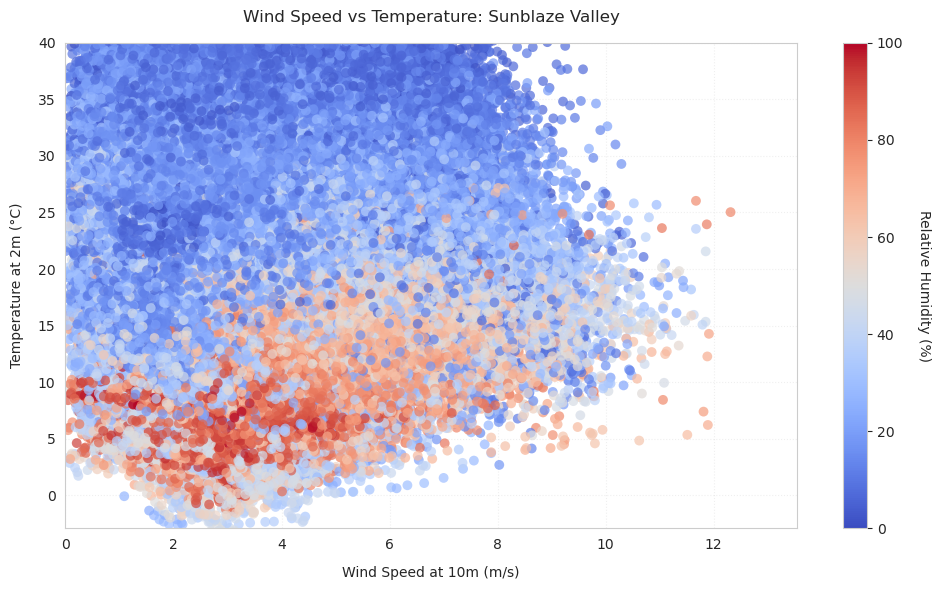

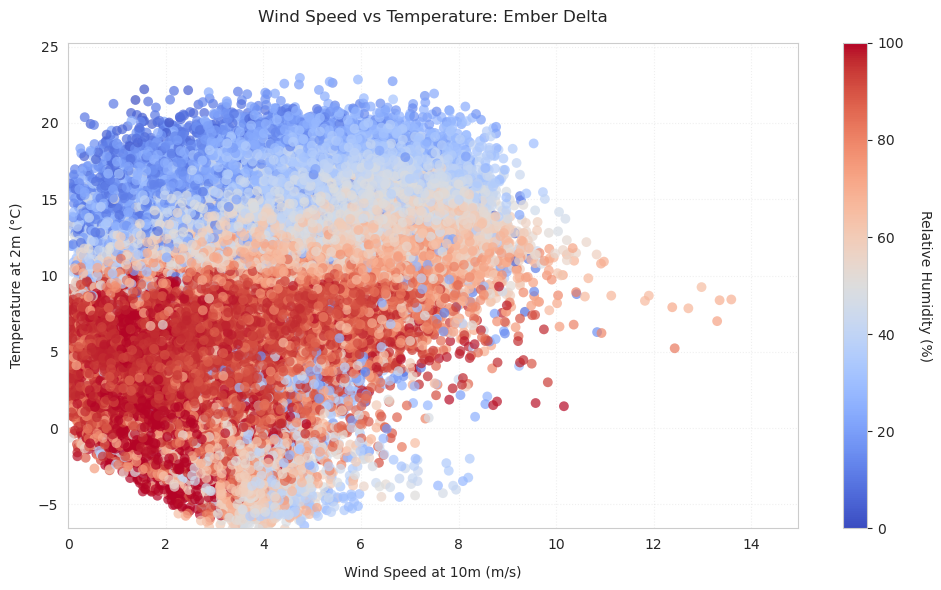

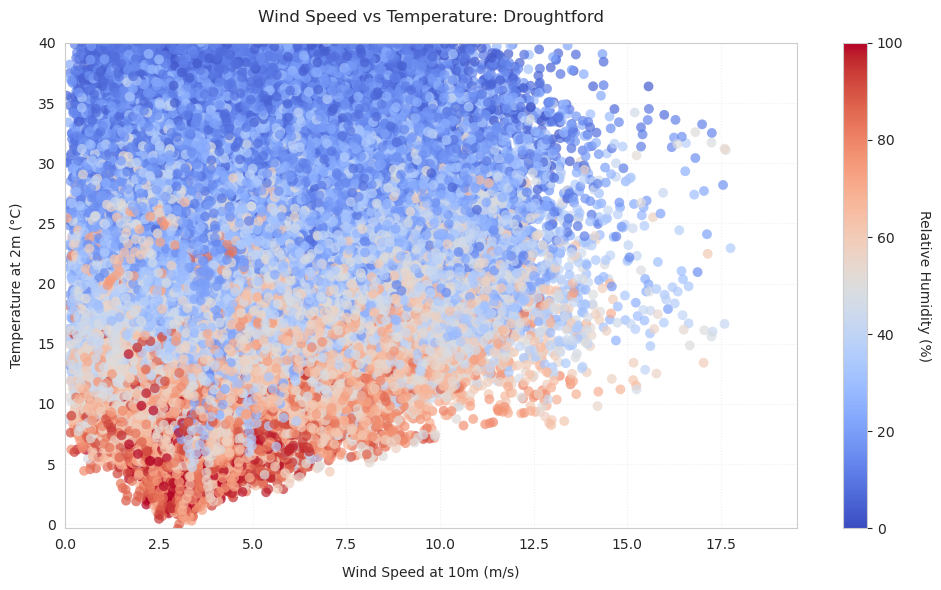

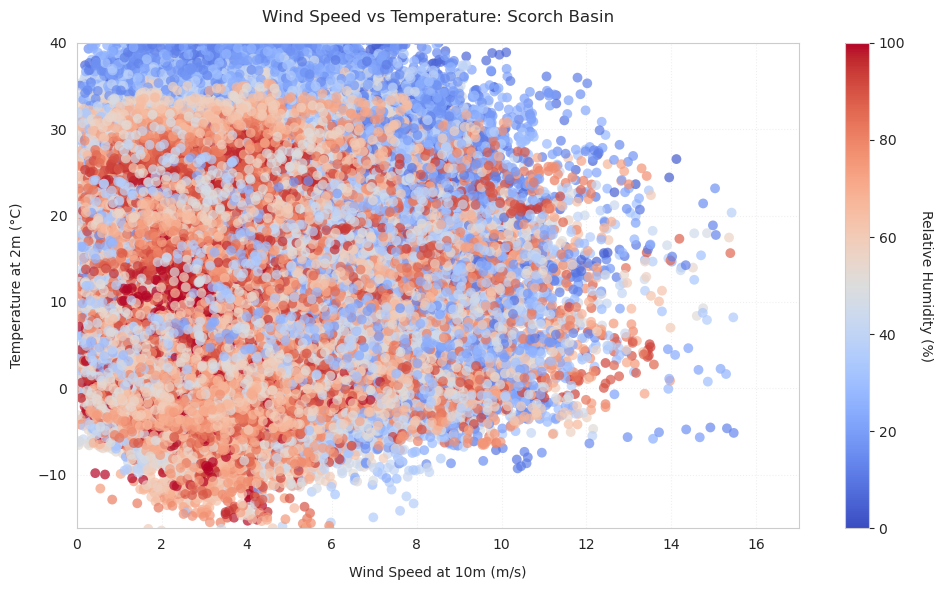

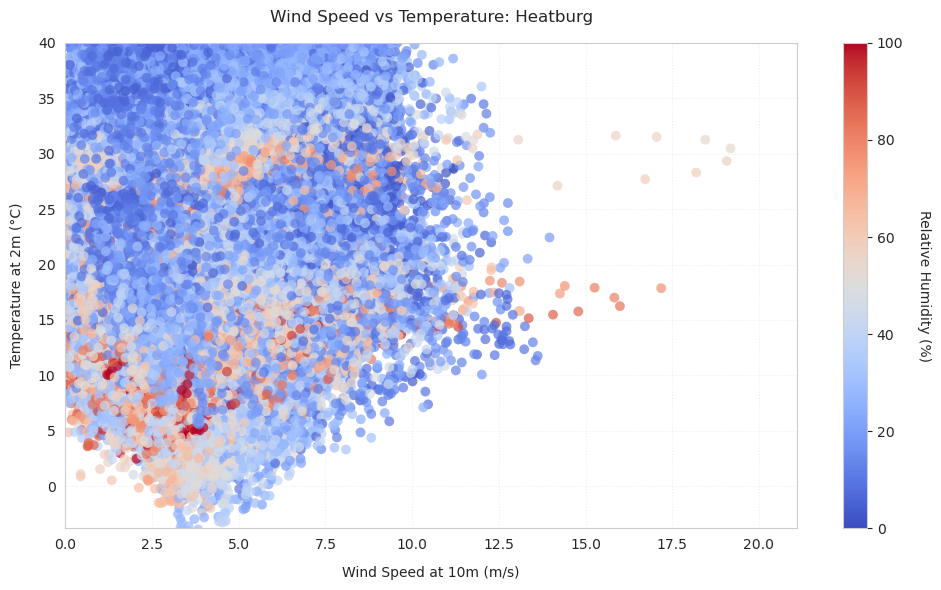

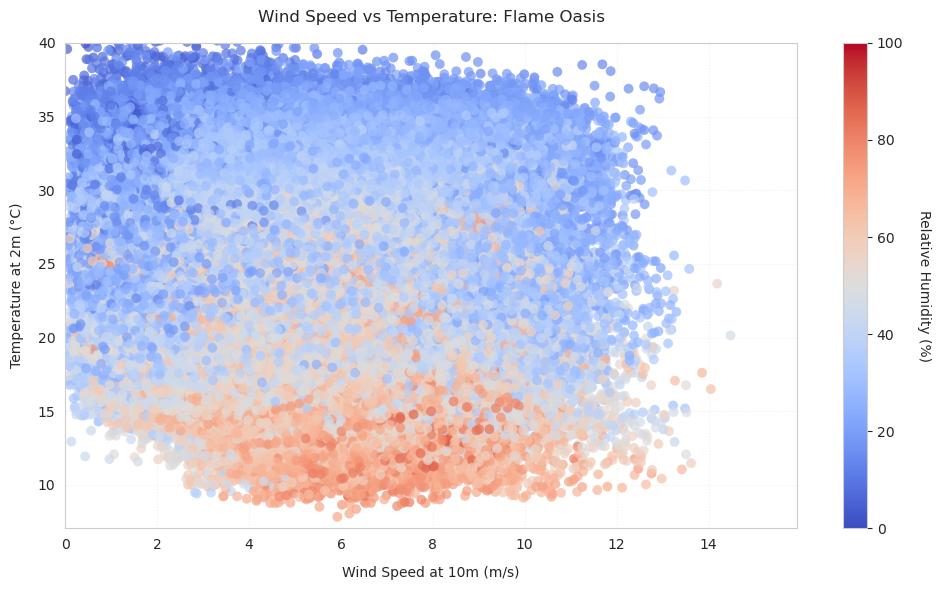

In [11]:
def plot_wind_temp_by_region(df):
    try:
        df = df.copy()
        # Clean data - remove extreme outliers
        df = df[(df['WS10M'] >= 0) & (df['WS10M'] <= 30) & 
               (df['T2M'] >= -30) & (df['T2M'] <= 50)]
        
        regions = df["REGION"].unique()
        
        for region in regions:
            region_df = df[df["REGION"] == region]
            
            if not region_df.empty:
                plt.figure(figsize=(10, 6))
                ax = plt.gca()  # Get current axes
                
                # Create scatterplot with enhanced styling
                scatter = sns.scatterplot(
                    data=region_df,
                    x="WS10M",
                    y="T2M",
                    hue="RH2M",  # Using relative humidity
                    palette="coolwarm",
                    alpha=0.7,
                    edgecolor='none',
                    s=50,  # Slightly larger points
                    ax=ax  # Explicitly specify axes
                )
                
                # Create properly formatted colorbar
                norm = plt.Normalize(0, 100)  # RH scale 0-100%
                sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
                sm.set_array(region_df["RH2M"])  # Set the data array
                
                # Add colorbar to the existing axes
                cbar = plt.colorbar(sm, ax=ax)
                cbar.set_label('Relative Humidity (%)', rotation=270, labelpad=20)
                
                # Style the plot
                plt.title(f"Wind Speed vs Temperature: {region}", pad=15)
                plt.xlabel("Wind Speed at 10m (m/s)", labelpad=10)
                plt.ylabel("Temperature at 2m (°C)", labelpad=10)
                plt.grid(True, linestyle=':', alpha=0.3)
                
                # Remove legend (using colorbar instead)
                scatter.legend_.remove()
                
                # Set consistent axis limits
                plt.xlim(0, min(25, region_df["WS10M"].max() * 1.1))
                plt.ylim(
                    max(-20, region_df["T2M"].min() * 0.9),
                    min(40, region_df["T2M"].max() * 1.1)
                )
                
                plt.tight_layout()
                plt.show()
                
            else:
                print(f"No data available for {region}")
                
    except Exception as e:
        print(f"Error in wind-temperature plot: {str(e)}")


plot_wind_temp_by_region(df)